# 1. Importing Libraries 📚

👉 Including the libraries that will be utilized in this notebook.

In [2]:
# Core Libraries
import numpy as np
import pandas as pd
import os
import random

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS
plt.style.use('ggplot')

# Text Processing and NLP Libraries
import spacy
from spacy import displacy
from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from bertopic import BERTopic
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.preprocessing import LabelEncoder

# Machine Learning Libraries
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import (log_loss, accuracy_score, confusion_matrix, classification_report,
                             precision_score, recall_score, f1_score)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.datasets import fetch_20newsgroups
from sklearn import metrics

# Deep Learning Libraries
import torch
from torch.utils.data import DataLoader, Dataset
from transformers import (AutoModelForSequenceClassification, AutoTokenizer, AutoConfig,
                          AutoModelForCausalLM, BertTokenizer, BertForSequenceClassification,
                          TrainingArguments, Trainer, EarlyStoppingCallback)
from transformers import pipeline

# Hugging Face Datasets and Metrics
from datasets import Dataset as HF_Dataset, load_metric

# Utility Libraries
from tqdm import tqdm
import logging
from optparse import OptionParser
from time import time
from types import SimpleNamespace
from IPython.display import display, HTML
from contextlib import redirect_stdout
import io
from pathlib import Path

# Word Embeddings Libraries
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

# WordCloud and Stopwords
from wordcloud import WordCloud
from nltk.stem.snowball import SnowballStemmer
import re
import string

# Settings and Warnings
import warnings
warnings.simplefilter("ignore", DeprecationWarning)

# Pandas Display Settings
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)

# NLTK Resource Downloads
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')

# Stopwords Initialization
stop_words = set(stopwords.words('english'))


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/gamzeakkurt/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/gamzeakkurt/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/gamzeakkurt/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


# 2. Information About Data 👓

👉 After importing the necessary libraries, the next step involves loading the dataset that we intend to use for our analysis or application. This dataset will serve as the foundation for the tasks we aim to perform. By ensuring the data is properly imported, we set the stage for subsequent processing and exploration.

**Reading Files**

In [3]:
topics=pd.read_csv('topics.csv')
opinions=pd.read_csv('opinions.csv')
conclusion=pd.read_csv('conclusions.csv')

👉 The data consists of three distinct datasets: topics, opinions, and conclusions. Each will be meticulously analyzed to ensure a thorough understanding.

**Head of Data**

In [3]:
topics.head(5)

,id,topic_id,text,type,effectiveness
0,9704a709b505,007ACE74B050,"On my perspective, I think that the face is a natural landform because I dont think that there is any life on Mars. In these next few paragraphs, I'll be talking about how I think that is is a natural landform",Position,Adequate
1,de347c859ab6,00944C693682,"With so many things in this world that few people agree on, this is a nice change to see in regards the removal of so many cars. Why would they all agree, one might ask. Well, there are plenty of reasons. \n",Position,Effective
2,c20937683442,00BD97EA4041,"No because, why should a computer know how your feeling?",Position,Adequate
3,9d03e2bef0ff,00C6E82FE5BA,I think that it wouldn't be valueable to have technology be able to read emotions,Position,Adequate
4,c2203a58aa5c,013B9AA6B9DB,"Well, some people believe that it was something made by aliens. I am here to prove that it was not. \n",Position,Adequate


In [4]:
opinions.head(5)

,id,topic_id,text,type,effectiveness
0,c22adee811b6,007ACE74B050,I think that the face is a natural landform because there is no life on Mars that we have descovered yet,Claim,Adequate
1,a10d361e54e4,007ACE74B050,"If life was on Mars, we would know by now. The reason why I think it is a natural landform because, nobody live on Mars in order to create the figure. It says in paragraph 9, ""It's not easy to target Cydonia,"" in which he is saying that its not easy to know if it is a natural landform at this point. In all that they're saying, its probably a natural landform.",Evidence,Adequate
2,db3e453ec4e2,007ACE74B050,People thought that the face was formed by alieans because they thought that there was life on Mars.,Counterclaim,Adequate
3,36a565e45db7,007ACE74B050,"though some say that life on Mars does exist, I think that there is no life on Mars.",Rebuttal,Ineffective
4,fb65fe816ba3,007ACE74B050,"It says in paragraph 7, on April 5, 1998, Mars Global Surveyor flew over Cydonia for the first time. Michael Malin took a picture of Mars with his Orbiter Camera, that the face was a natural landform.",Evidence,Adequate


In [5]:
conclusion.head(5)

,id,topic_id,text,type,effectiveness
0,28a94d3ee425,007ACE74B050,"Though people were not satified about how the landform was a natural landform, in all, we new that alieans did not form the face. I would like to know how the landform was formed. we know now that life on Mars doesn't exist.",Concluding Statement,Adequate
1,9fd314f638e5,00944C693682,"Individual car use isn't bad. Millions of individuals using cars, however, is very bad. Note the emphasis. Even just making a concious effort to car pool, bike to work or school, use public transportation, or use some sort of alternative transportation could be enough to clear up the air of some of it's emissions, keep oneself and others happier and less stressed, save time and money, and improve their city all in one little decision. It's just a matter of going ahead and doing it, so what is stopping anyone from going out and making that change now? Be the change you want to see and limit your car usage now.",Concluding Statement,Effective
2,af494e4e0b4f,00BD97EA4041,To conclusion computers in school shouldn't detect emotions of the students. I have proved my point on why it shouldn't be in school. I have given you several examples from the passage to prove this point. It shoudn't matter if the computer knows how your feeling.,Concluding Statement,Adequate
3,9c3b9503c9a4,00C6E82FE5BA,"The reasons why i said that this would be unvalueable is because the reason of security,like anything could go wrong because everything in technology can be unexpected. thats why i chose the reasons I did.",Concluding Statement,Adequate
4,b199e5df1815,013B9AA6B9DB,"So, in conclusion, the famous face on Mars was a natural landform. This is supported by the pictures taken in 1998 and 2001. The image captured in 2001 could also possibly see other objects if there were any. So, the face not a sign of life on Mars.",Concluding Statement,Adequate


👉 It is evident that all three datasets share the same feature names: `id`, `topic_id`, `text`, `type`, and `effectiveness`.

**Data Shape**

In [6]:
topics.shape

(4024, 5)

In [7]:
opinions.shape

(27099, 5)

In [8]:
conclusion.shape

(3351, 5)

**Checking Null Values**

In [9]:
topics.isnull().sum()

id               0
topic_id         0
text             0
type             0
effectiveness    0
dtype: int64

In [10]:
opinions.isnull().sum()

id               0
topic_id         0
text             0
type             0
effectiveness    0
dtype: int64

In [11]:
conclusion.isnull().sum()

id               0
topic_id         0
text             0
type             0
effectiveness    0
dtype: int64

👉 Neither of them contains any null values.

**Checking Duplicated Values**

In [12]:
topics.duplicated().sum()

0

In [13]:
opinions.duplicated().sum()

0

In [14]:
conclusion.duplicated().sum()

0

👉 None of the datasets contain any duplicated values.

**Detailed Information About Data**

In [15]:
topics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             4024 non-null   object
 1   topic_id       4024 non-null   object
 2   text           4024 non-null   object
 3   type           4024 non-null   object
 4   effectiveness  4024 non-null   object
dtypes: object(5)
memory usage: 157.3+ KB


In [16]:
opinions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27099 entries, 0 to 27098
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             27099 non-null  object
 1   topic_id       27099 non-null  object
 2   text           27099 non-null  object
 3   type           27099 non-null  object
 4   effectiveness  27099 non-null  object
dtypes: object(5)
memory usage: 1.0+ MB


In [17]:
conclusion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3351 entries, 0 to 3350
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             3351 non-null   object
 1   topic_id       3351 non-null   object
 2   text           3351 non-null   object
 3   type           3351 non-null   object
 4   effectiveness  3351 non-null   object
dtypes: object(5)
memory usage: 131.0+ KB


# 3. Exploratory Data Analysis  🔍

👉 In this section, we will closely look at the data with a number of visualizations to get useful insights and find patterns. We also interpret the outcome of each visualization. We want to be sure that we understand the structure of the underlying data and the relationships among variables.

Before starting the analysis, we'll merge the topics, opinions, and conclusion data. It's quite a standard operation. In this way, we keep our work simple, and straightforward, and the whole dataset easily accessible and exploratory at all stages. 

In [4]:
combined_df = pd.concat([topics, opinions, conclusion], ignore_index=True)

In [5]:
combined_df.shape

(34474, 5)

In [6]:
combined_df['full_text'] = combined_df['text'].groupby(combined_df['topic_id']).transform(lambda x: ' '.join(x)) 

In [7]:
combined_df.full_text.iloc[2]

'No because, why should a computer know how your feeling?  It wouldn\'t change the emotion the students feeling. It also wouldn\'t help with the students education. Its over all just a waste of time.  The process begins when the computer puts together a 3-D digital model. There are 44 major muscles in your face that the computer has to detect. Eckman classified six emotions happiness, surprise, anger, disgust, fear, and sadness. He then " associated each with characteristic movements of facial muscles."\n\nFor example the frontalis pars lateralis muscle is above your eye which shows your surpried when it is raised.\n\nUs humans alone can identify facial expressions on peoples faces. If you look at a friend you can tell how they are feeling at that moment. Da Vinci studied human anatomy to help paint the facial muscles percisely on the Mona Lisa painting. Dr. Huangs has new computer software it stores similar info as electronic code. He thinks there could be a different type of code to 

## 3.1 Full Text Visualization

**Text Lenght**

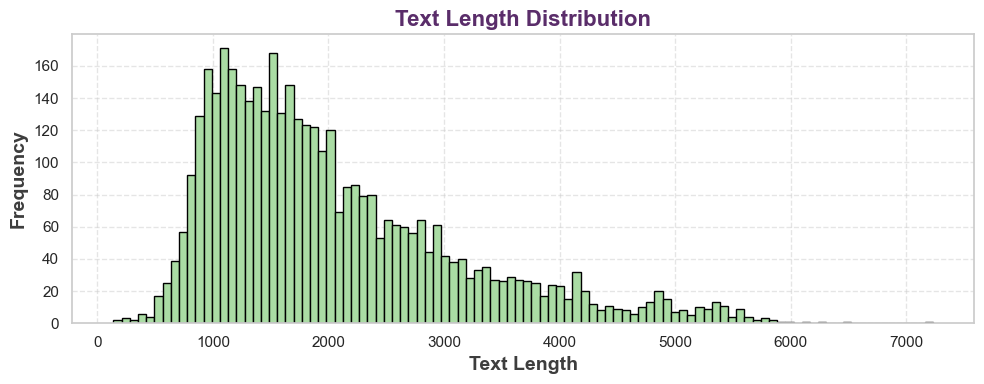

In [24]:
sns.set(style="whitegrid")  # Sets a clean background style
color_palette = sns.color_palette("Spectral", as_cmap=True)  # You can try other palettes like "coolwarm", "viridis", etc.

# Calculate text lengths
text_length = combined_df['full_text'].drop_duplicates().apply(len)

# Create a figure with a specific size
fig = plt.figure(figsize=(10, 4))

# Create the histogram plot
ax1 = text_length.plot(kind='hist', color=color_palette(0.7), bins=100, edgecolor='black')

# Set the title and labels with more elegant formatting
ax1.set_title('Text Length Distribution', fontsize=16, fontweight='bold', color="#5A2D6A")
ax1.set_xlabel("Text Length", fontsize=14, fontweight='bold', color="#3D3D3D")
ax1.set_ylabel("Frequency", fontsize=14, fontweight='bold', color="#3D3D3D")

# Optionally, set grid and other aesthetics
ax1.grid(True, linestyle='--', alpha=0.5)

# Show the plot
plt.tight_layout()
plt.show()


👉 The graph above illustrates the distribution of text lengths. It is evident that the majority of texts have a frequency ranging from 1,000 to 2,000 characters.

**Word Count**

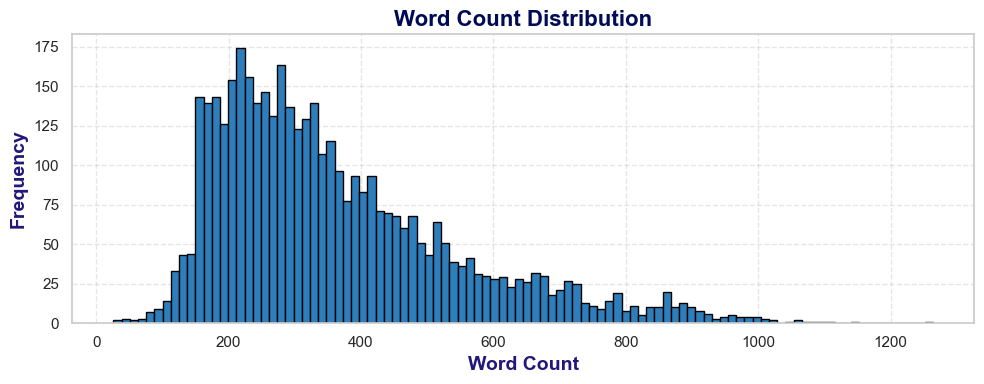

In [25]:
color_palette = sns.color_palette("Blues", as_cmap=True)  # You can experiment with palettes like "coolwarm", "inferno", etc.

# Calculate word counts
word_count = combined_df['full_text'].drop_duplicates().apply(lambda x: len(str(x).split()))

# Create the figure with a specific size
fig = plt.figure(figsize=(10, 4))

# Create the histogram plot with a colorful palette
ax1 = word_count.plot(kind='hist', color=color_palette(0.7), bins=100, edgecolor='black')

# Set the title and labels with enhanced formatting
ax1.set_title('Word Count Distribution', fontsize=16, fontweight='bold', color="#000B58")
ax1.set_xlabel("Word Count", fontsize=14, fontweight='bold', color="#22177A")
ax1.set_ylabel("Frequency", fontsize=14, fontweight='bold', color="#22177A")

# Optionally, set grid and other aesthetics
ax1.grid(True, linestyle='--', alpha=0.5)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


👉 The graph illustrates the frequency of word counts in the data. It reveals that the word count distribution predominantly falls between 200 and 400 words.

## 3.2 Distribution of top n-grams for text


👉 The `get_n_words` function extracts the most frequent words or n-grams (e.g., unigrams, bigrams) from a list of text documents. It optionally removes common stop words and returns the top `n` most frequent items based on the specified n-gram size.


In [26]:
def get_n_words(corpus, n=None, remove_stop_words=False, n_words=1):
 
    # Initialize CountVectorizer with or without stopwords removal
    if remove_stop_words:
        vec = CountVectorizer(stop_words='english', ngram_range=(n_words, n_words))
    else:
        vec = CountVectorizer(ngram_range=(n_words, n_words))
    
    # Fit the vectorizer and transform the corpus
    bag_of_words = vec.fit_transform(corpus)
    
    # Sum the frequencies of each n-gram
    sum_words = bag_of_words.sum(axis=0)
    
    # Create a list of tuples (n-gram, frequency)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    
    # Sort the words by frequency in descending order
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    
    # Return the top N words (if n is specified)
    if n is not None:
        return words_freq[:n]
    
    return words_freq  # Return all if n is not specified


**Unigrams**

👉 A unigram is a single word or token that appears in a text, used as the smallest unit in natural language processing for analysis.

In [27]:
unigram_words = get_n_words(combined_df['full_text'].drop_duplicates(), 20, remove_stop_words=True, n_words=1)
for word, freq in unigram_words:
    print(word, freq)

students 11229
people 9734
school 6561
electoral 6443
vote 5558
like 5464
college 5419
just 4810
think 4555
time 4416
help 4351
make 4215
venus 4058
president 4012
student 3855
want 3389
know 3223
states 3185
work 3139
way 3123


Let's visualize this result

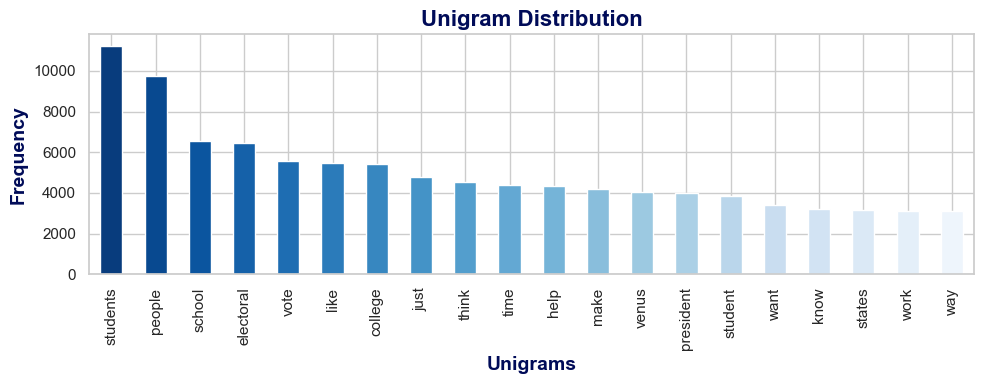

In [28]:
df_tmp = pd.DataFrame(unigram_words, columns = ['text' , 'count'])

# Set the pink color palette from Seaborn
sns.set(style="whitegrid")
pink_palette = sns.color_palette("Blues_r", n_colors=len(df_tmp))  # Reversed blues palette

# Create the figure with a specific size
fig = plt.figure(figsize=(10, 4))

# Plot the bar chart using the pink color palette
ax1 = df_tmp.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=pink_palette)
ax1.set_title('Unigram Distribution', fontsize=16, fontweight='bold', color="#000B58")
ax1.set_xlabel("Unigrams", fontsize=14, fontweight='bold', color="#000B58")
ax1.set_ylabel("Frequency", fontsize=14, fontweight='bold', color="#000B58")

# Show the plot
plt.tight_layout()
plt.show()


👉 The bar graph displays the most frequently occurring words in the text, clearly indicating that "student" and "people" are used most often.

**Bigrams**

👉 Bigrams are pairs of consecutive words or tokens in a text, used to analyze word combinations and their relationships.

In [29]:
bigrams_words = get_n_words(topics['text'].drop_duplicates(), 20, remove_stop_words=True, n_words=2)
for word, freq in bigrams_words:
    print(word, freq)

electoral college 596
community service 257
popular vote 222
driverless cars 133
united states 123
election popular 110
venus worthy 104
think students 103
cell phones 101
summer projects 96
studying venus 96
vote president 96
worthy pursuit 95
classes home 95
natural landform 87
president united 87
good idea 86
face mars 84
students benefit 84
despite dangers 79


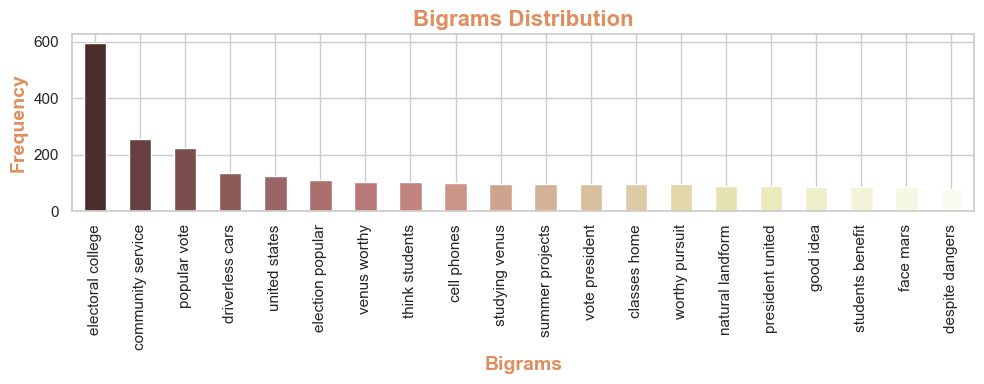

In [30]:
df_tmp = pd.DataFrame(bigrams_words, columns = ['text' , 'count'])

# Set the pink color palette from Seaborn
sns.set(style="whitegrid")
pink_palette = sns.color_palette("pink", n_colors=len(df_tmp))

# Create the figure with a specific size
fig = plt.figure(figsize=(10, 4))

# Plot the bar chart using the pink color palette
ax1 = df_tmp.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=pink_palette)
ax1.set_title('Bigrams Distribution', fontsize=16, fontweight='bold', color="#DE8F5F")
ax1.set_xlabel("Bigrams", fontsize=14, fontweight='bold', color="#DE8F5F")
ax1.set_ylabel("Frequency", fontsize=14, fontweight='bold', color="#DE8F5F")

# Show the plot
plt.tight_layout()
plt.show()


👉  The phrases "Electoral College," "community service," and "popular vote" are among the most frequently occurring terms in the dataset. 

**Trigrams**

👉 Trigrams are sequences of three consecutive words or tokens in a text, used to analyze patterns and relationships between groups of words.

In [31]:
trigrams_words = get_n_words(topics['text'].drop_duplicates(), 20, remove_stop_words=True, n_words=3)
for word, freq in trigrams_words:
    print(word, freq)

election popular vote 99
venus worthy pursuit 88
president united states 81
studying venus worthy 74
popular vote president 71
worthy pursuit despite 69
attend classes home 66
pursuit despite dangers 62
vote president united 62
facial action coding 60
think electoral college 54
keeping electoral college 49
challenge exploring venus 48
just natural landform 47
benefit able attend 46
able attend classes 46
limiting car usage 45
change election popular 45
students benefit able 44
perform community service 41


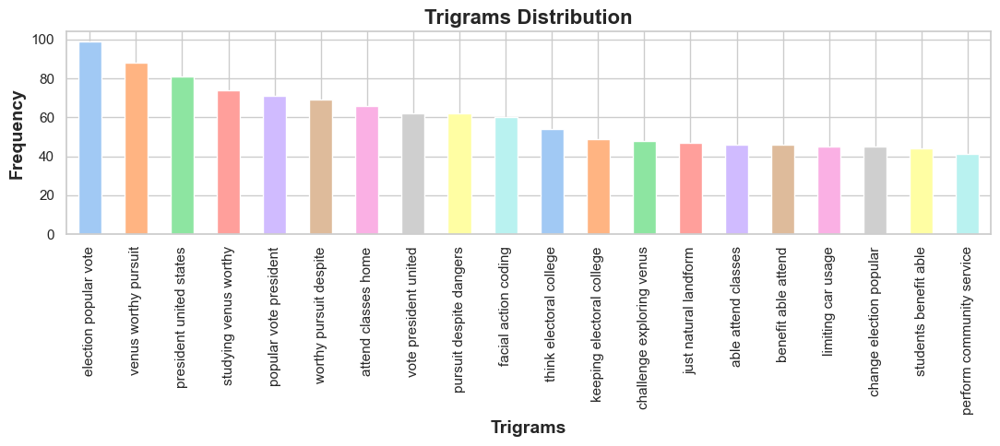

In [32]:
df_tmp = pd.DataFrame(trigrams_words, columns = ['text' , 'count'])

# Set the pink color palette from Seaborn
sns.set(style="whitegrid")
pink_palette = sns.color_palette("pastel", n_colors=len(df_tmp))

# Create the figure with a specific size
fig = plt.figure(figsize=(11, 5))

# Plot the bar chart using the pink color palette
ax1 = df_tmp.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=pink_palette)
ax1.set_title('Trigrams Distribution', fontsize=16, fontweight='bold' )
ax1.set_xlabel("Trigrams", fontsize=14, fontweight='bold')
ax1.set_ylabel("Frequency", fontsize=14, fontweight='bold')

# Show the plot
plt.tight_layout()
plt.show()


👉 The trigrams "election popular vote," "venus worth pursuit," and "president united states" have the highest distribution in the dataset. These phrases appear frequently, reflecting the dataset's strong focus on political topics, space exploration, and leadership.

**Distribution of top n-grams for each type** 

**Unigrams**

In [33]:
# List of text types for processing
text_types = ['Position', 'Evidence', 'Claim', 'Concluding Statement', 'Counterclaim', 'Rebuttal']

# Dictionary to store common words for each text type
common_words_dict = {}

# Loop through each text type and get the most common n-grams
for text_type in text_types:
    text_data = combined_df[combined_df.type == text_type].text.values
    common_words_dict[text_type] = get_n_words(text_data, 20, remove_stop_words=True, n_words=1)

# You now have a dictionary with the most common bigrams for each text type
common_words_Position = common_words_dict['Position']
common_words_Evidence = common_words_dict['Evidence']
common_words_Claim = common_words_dict['Claim']
common_words_Concluding_Statement = common_words_dict['Concluding Statement']
common_words_Counterclaim = common_words_dict['Counterclaim']
common_words_Rebuttal = common_words_dict['Rebuttal']


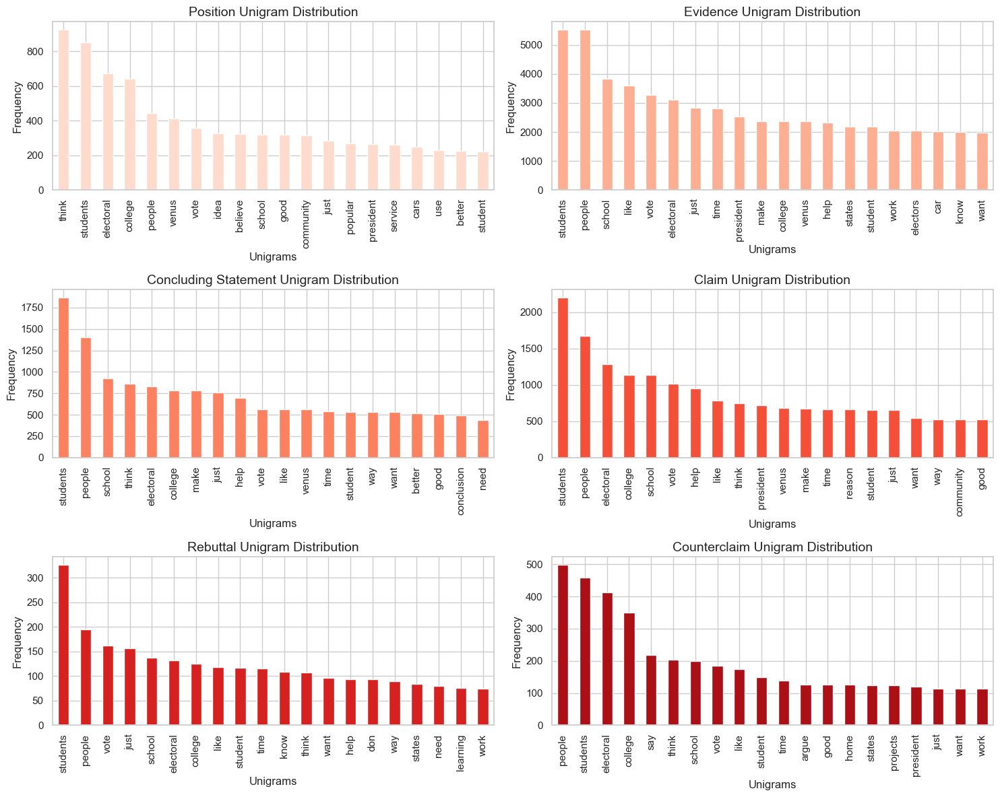

In [34]:
color_palette = sns.color_palette("Reds", n_colors=6)  # Adjust palette as per your preference

# Convert common words to dataframes
df_tmp_Position = pd.DataFrame(common_words_Position, columns = ['text', 'count'])
df_tmp_Evidence = pd.DataFrame(common_words_Evidence, columns = ['text', 'count'])
df_tmp_Claim = pd.DataFrame(common_words_Claim, columns = ['text', 'count'])
df_tmp_Concluding_Statement = pd.DataFrame(common_words_Concluding_Statement, columns = ['text', 'count'])
df_tmp_Counterclaim = pd.DataFrame(common_words_Counterclaim, columns = ['text', 'count'])
df_tmp_Rebuttal = pd.DataFrame(common_words_Rebuttal, columns = ['text', 'count'])

# Create a figure with multiple subplots for each type of statement
fig, axes = plt.subplots(3, 2, figsize=(15, 12))

# Position Unigram Distribution
df_tmp_Position.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[0], ax=axes[0, 0])
axes[0, 0].set_title('Position Unigram Distribution', fontsize=14)
axes[0, 0].set_xlabel('Unigrams', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)

# Evidence Unigram Distribution
df_tmp_Evidence.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[1], ax=axes[0, 1])
axes[0, 1].set_title('Evidence Unigram Distribution', fontsize=14)
axes[0, 1].set_xlabel('Unigrams', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)

# Concluding Statement Unigram Distribution
df_tmp_Concluding_Statement.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[2], ax=axes[1, 0])
axes[1, 0].set_title('Concluding Statement Unigram Distribution', fontsize=14)
axes[1, 0].set_xlabel('Unigrams', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)

# Claim Unigram Distribution
df_tmp_Claim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[3], ax=axes[1, 1])
axes[1, 1].set_title('Claim Unigram Distribution', fontsize=14)
axes[1, 1].set_xlabel('Unigrams', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)

# Rebuttal Unigram Distribution
df_tmp_Rebuttal.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[4], ax=axes[2, 0])
axes[2, 0].set_title('Rebuttal Unigram Distribution', fontsize=14)
axes[2, 0].set_xlabel('Unigrams', fontsize=12)
axes[2, 0].set_ylabel('Frequency', fontsize=12)

# Counterclaim Unigram Distribution
df_tmp_Counterclaim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[5], ax=axes[2, 1])
axes[2, 1].set_title('Counterclaim Unigram Distribution', fontsize=14)
axes[2, 1].set_xlabel('Unigrams', fontsize=12)
axes[2, 1].set_ylabel('Frequency', fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


👉 The graphs above display the most frequently occurring words within the texts of each class. Upon closer examination, we observe that the word *students* dominates in all classes except for *position* and *counterclaim*. In the *counterclaim* class, the word *people* is the most common, while *think* stands out in the *position* class. Notably, the words across all classes appear to share a high degree of similarity.

**Bigrams**

In [35]:
# List of text types for processing
text_types = ['Position', 'Evidence', 'Claim', 'Concluding Statement', 'Counterclaim', 'Rebuttal']

# Dictionary to store common words for each text type
common_words_dict = {}

# Loop through each text type and get the most common n-grams
for text_type in text_types:
    text_data = combined_df[combined_df.type == text_type].text.values
    common_words_dict[text_type] = get_n_words(text_data, 20, remove_stop_words=True, n_words=2)

# You now have a dictionary with the most common bigrams for each text type
common_words_Position = common_words_dict['Position']
common_words_Evidence = common_words_dict['Evidence']
common_words_Claim = common_words_dict['Claim']
common_words_Concluding_Statement = common_words_dict['Concluding Statement']
common_words_Counterclaim = common_words_dict['Counterclaim']
common_words_Rebuttal = common_words_dict['Rebuttal']


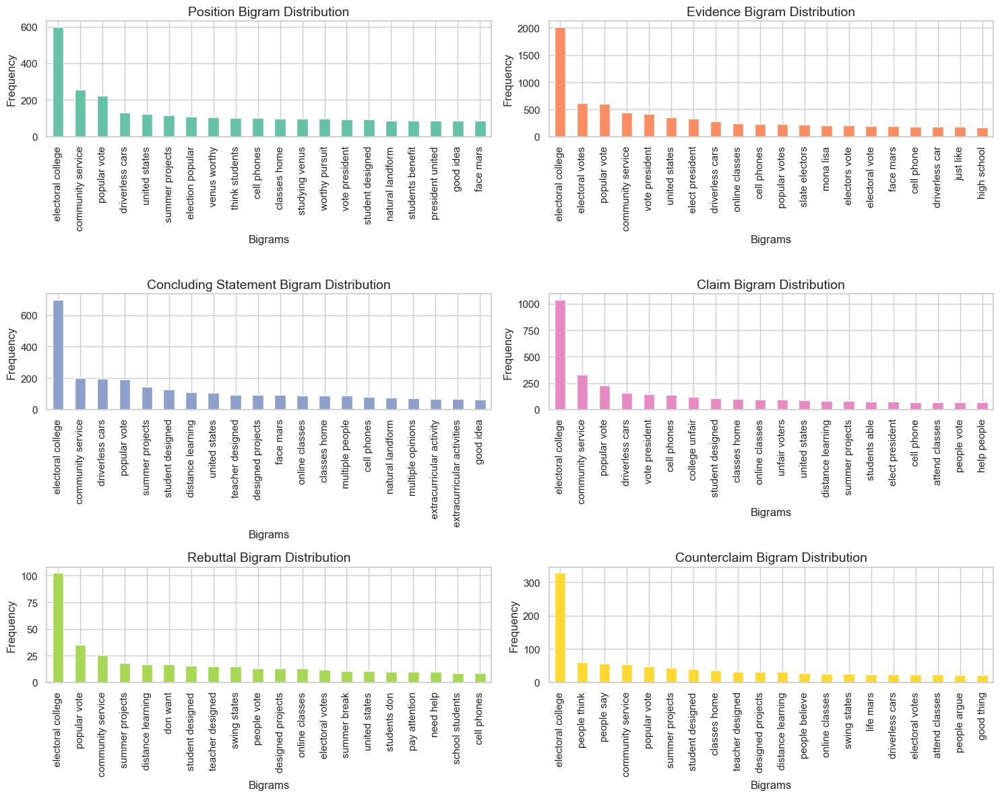

In [36]:
color_palette = sns.color_palette("Set2", n_colors=6)  # Adjust palette as per your preference

# Convert common words to dataframes
df_tmp_Position = pd.DataFrame(common_words_Position, columns = ['text', 'count'])
df_tmp_Evidence = pd.DataFrame(common_words_Evidence, columns = ['text', 'count'])
df_tmp_Claim = pd.DataFrame(common_words_Claim, columns = ['text', 'count'])
df_tmp_Concluding_Statement = pd.DataFrame(common_words_Concluding_Statement, columns = ['text', 'count'])
df_tmp_Counterclaim = pd.DataFrame(common_words_Counterclaim, columns = ['text', 'count'])
df_tmp_Rebuttal = pd.DataFrame(common_words_Rebuttal, columns = ['text', 'count'])

# Create a figure with multiple subplots for each type of statement
fig, axes = plt.subplots(3, 2, figsize=(15, 12))

# Position Unigram Distribution
df_tmp_Position.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[0], ax=axes[0, 0])
axes[0, 0].set_title('Position Bigram Distribution', fontsize=14)
axes[0, 0].set_xlabel('Bigrams', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)

# Evidence Unigram Distribution
df_tmp_Evidence.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[1], ax=axes[0, 1])
axes[0, 1].set_title('Evidence Bigram Distribution', fontsize=14)
axes[0, 1].set_xlabel('Bigrams', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)

# Concluding Statement Unigram Distribution
df_tmp_Concluding_Statement.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[2], ax=axes[1, 0])
axes[1, 0].set_title('Concluding Statement Bigram Distribution', fontsize=14)
axes[1, 0].set_xlabel('Bigrams', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)

# Claim Unigram Distribution
df_tmp_Claim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[3], ax=axes[1, 1])
axes[1, 1].set_title('Claim Bigram Distribution', fontsize=14)
axes[1, 1].set_xlabel('Bigrams', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)

# Rebuttal Unigram Distribution
df_tmp_Rebuttal.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[4], ax=axes[2, 0])
axes[2, 0].set_title('Rebuttal Bigram Distribution', fontsize=14)
axes[2, 0].set_xlabel('Bigrams', fontsize=12)
axes[2, 0].set_ylabel('Frequency', fontsize=12)

# Counterclaim Unigram Distribution
df_tmp_Counterclaim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[5], ax=axes[2, 1])
axes[2, 1].set_title('Counterclaim Bigram Distribution', fontsize=14)
axes[2, 1].set_xlabel('Bigrams', fontsize=12)
axes[2, 1].set_ylabel('Frequency', fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


👉 The graphs illustrate the most common bigram phrases in the text. Notably, *electoral college* is the most frequent bigram across all classes. In the *position*, *claim*, and *concluding statement* classes, the second most frequent bigram is *community service*. However, this varies across the other classes.

**Trigrams**

In [37]:
# List of text types for processing
text_types = ['Position', 'Evidence', 'Claim', 'Concluding Statement', 'Counterclaim', 'Rebuttal']

# Dictionary to store common words for each text type
common_words_dict = {}

# Loop through each text type and get the most common n-grams
for text_type in text_types:
    text_data = combined_df[combined_df.type == text_type].text.values
    common_words_dict[text_type] = get_n_words(text_data, 20, remove_stop_words=True, n_words=3)

# You now have a dictionary with the most common bigrams for each text type
common_words_Position = common_words_dict['Position']
common_words_Evidence = common_words_dict['Evidence']
common_words_Claim = common_words_dict['Claim']
common_words_Concluding_Statement = common_words_dict['Concluding Statement']
common_words_Counterclaim = common_words_dict['Counterclaim']
common_words_Rebuttal = common_words_dict['Rebuttal']


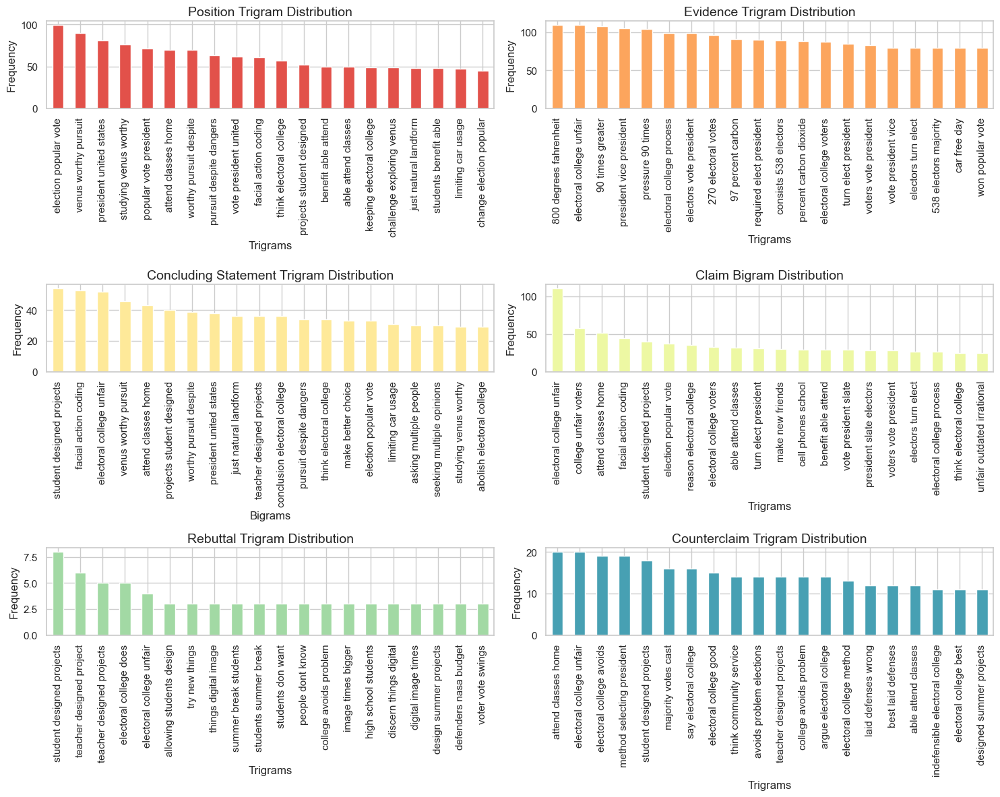

In [38]:
color_palette = sns.color_palette("Spectral", n_colors=6)  # Adjust palette as per your preference

# Convert common words to dataframes
df_tmp_Position = pd.DataFrame(common_words_Position, columns = ['text', 'count'])
df_tmp_Evidence = pd.DataFrame(common_words_Evidence, columns = ['text', 'count'])
df_tmp_Claim = pd.DataFrame(common_words_Claim, columns = ['text', 'count'])
df_tmp_Concluding_Statement = pd.DataFrame(common_words_Concluding_Statement, columns = ['text', 'count'])
df_tmp_Counterclaim = pd.DataFrame(common_words_Counterclaim, columns = ['text', 'count'])
df_tmp_Rebuttal = pd.DataFrame(common_words_Rebuttal, columns = ['text', 'count'])

# Create a figure with multiple subplots for each type of statement
fig, axes = plt.subplots(3, 2, figsize=(15, 12))

# Position Unigram Distribution
df_tmp_Position.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[0], ax=axes[0, 0])
axes[0, 0].set_title('Position Trigram Distribution', fontsize=14)
axes[0, 0].set_xlabel('Trigrams', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)

# Evidence Unigram Distribution
df_tmp_Evidence.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[1], ax=axes[0, 1])
axes[0, 1].set_title('Evidence Trigram Distribution', fontsize=14)
axes[0, 1].set_xlabel('Trigrams', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)

# Concluding Statement Unigram Distribution
df_tmp_Concluding_Statement.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[2], ax=axes[1, 0])
axes[1, 0].set_title('Concluding Statement Trigram Distribution', fontsize=14)
axes[1, 0].set_xlabel('Bigrams', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)

# Claim Unigram Distribution
df_tmp_Claim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[3], ax=axes[1, 1])
axes[1, 1].set_title('Claim Bigram Distribution', fontsize=14)
axes[1, 1].set_xlabel('Trigrams', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)

# Rebuttal Unigram Distribution
df_tmp_Rebuttal.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[4], ax=axes[2, 0])
axes[2, 0].set_title('Rebuttal Trigram Distribution', fontsize=14)
axes[2, 0].set_xlabel('Trigrams', fontsize=12)
axes[2, 0].set_ylabel('Frequency', fontsize=12)

# Counterclaim Unigram Distribution
df_tmp_Counterclaim.groupby('text').sum()['count'].sort_values(ascending=False).plot(
    kind='bar', color=color_palette[5], ax=axes[2, 1])
axes[2, 1].set_title('Counterclaim Trigram Distribution', fontsize=14)
axes[2, 1].set_xlabel('Trigrams', fontsize=12)
axes[2, 1].set_ylabel('Frequency', fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


👉 The graphs depict the trigrams present in the texts. Each class exhibits distinct trigram phrases, as shown in the visuals. However, the trigram *student designed projects* emerges as the most frequently used in both the *concluding statement* and *rebuttal* classes.

## 3.3 Distribution of Classification Labels

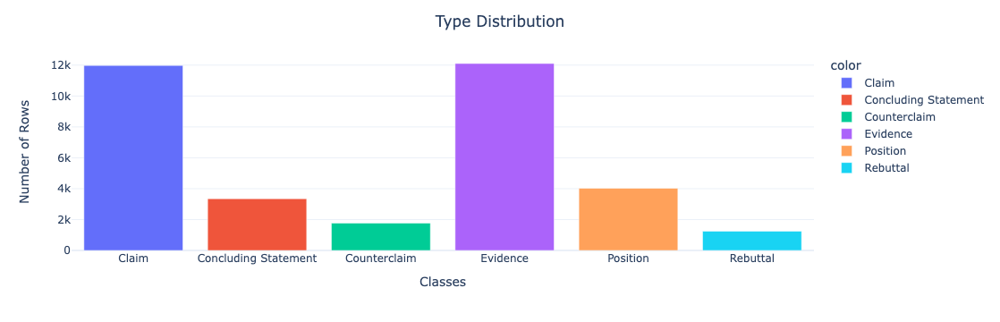

In [39]:

fig = px.bar(x = np.unique(combined_df["type"]),
y = [list(combined_df["type"]).count(i) for i in np.unique(combined_df["type"])] , 
            color = np.unique(combined_df["type"]),
             color_continuous_scale="Emrld") 
fig.update_xaxes(title="Classes")
fig.update_yaxes(title = "Number of Rows")
fig.update_layout(showlegend = True,
    title = {
        'text': 'Type Distribution ',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        template="plotly_white")
fig.show()


👉 The graph illustrates the distribution of classification labels, with 6 distinct classes. However, the sample sizes for each class vary significantly, leading to an imbalanced classification problem.

**Box Plot for Labels**

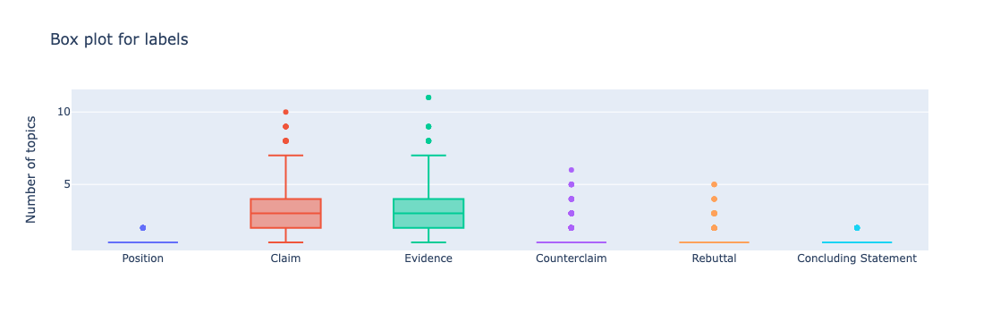

In [40]:
# count number of elements per discouse type in each essay
discourse_type_number = combined_df.groupby(['topic_id','type']).nunique().reset_index()[['id','type','topic_id']]

# plot a box chart to show quantiles, mean and median of nr of elements per discourse type
fig = go.Figure()
discourse = combined_df['type'].unique()

for d in discourse:
    dataset = discourse_type_number.loc[discourse_type_number['type'] == d]    
    fig.add_trace(go.Box(y=dataset['id'], 
                         text = dataset['id'],
                         hovertemplate='<b>id: %{text} - <br>Nr of discourse elements - %{y:.1f}</b>',
                         name=d))
    
fig.update_xaxes(showspikes=True)
fig.update_yaxes(showspikes=True)
fig.update_layout(showlegend = False,
                  title = 'Box plot for labels',
                  yaxis_title="Number of topics")
fig.show()

👉 The Claim and Evidence labels exhibit the highest median values compared to the other labels. The dots indicate the presence of outliers in the data.

**Average word length in each element per type**

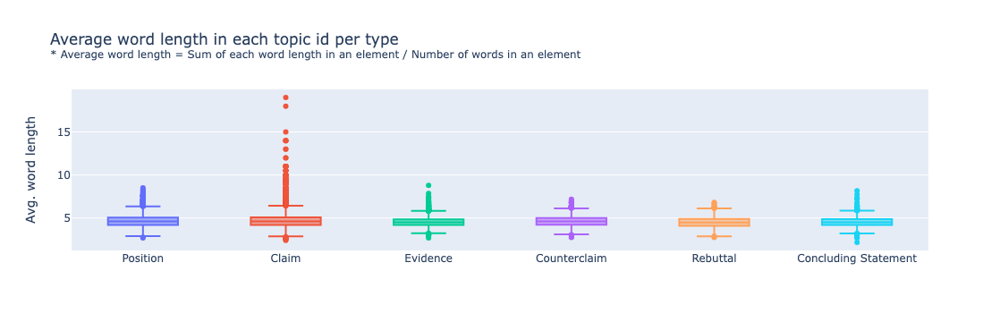

In [41]:
# avgerage word length = sum of word length / number of words in an element
def average_word_length(text):
    words = text.split()
    word_count = len(words)
    word_length = 0
    for word in words:
        word_length += len(word)
    avg_word_length = round(word_length/word_count,2)
    return avg_word_length

# create a new column avg_word_length to store the data
combined_df['avg_word_length'] = combined_df['text'].apply(average_word_length)

# plot a box chart to show quantiles, mean and median of average word length per discourse type
fig = go.Figure()
discourse = combined_df['type'].unique()

for d in discourse:
    dataset = combined_df.loc[combined_df['type'] == d]    
    fig.add_trace(go.Box(y=dataset['avg_word_length'], 
                         text = dataset['id'],
                         hovertemplate='<b>discourse_id: %{text} - <br>Average word length - %{y:.1f}</b>',
                         name=d))
    
fig.update_xaxes(showspikes=True)
fig.update_yaxes(showspikes=True)
fig.update_layout(showlegend = False,
                  title = 'Average word length in each topic id per type<sup><br>* Average word length = Sum of each word length in an element / Number of words in an element</br></sup>',
                  yaxis_title="Avg. word length")
fig.show()

👉 Do people tend to use longer words when stating Claims or Positions?

This bar graph shows that both Claims and Positions have the highest average word length (around 6.5 letters per word). However, Claims display a wider range, suggesting that some sentences may contain significantly longer words than others.

**Distribution of Effectiveness**

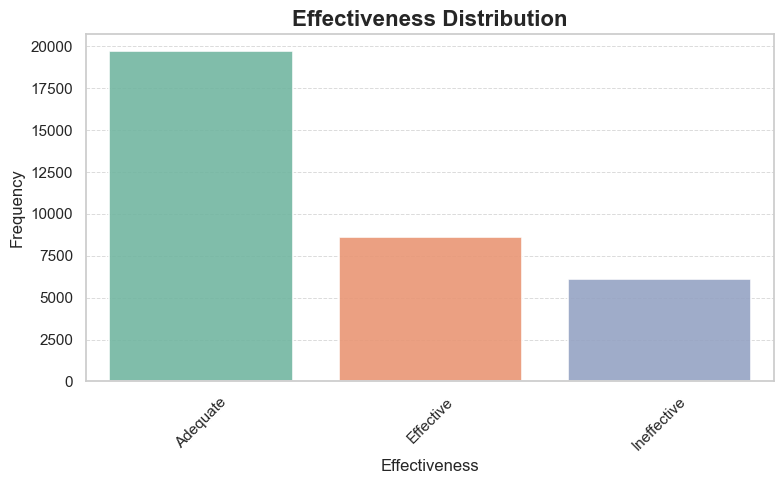

In [42]:
sns.set_palette("Set2")

# Create the figure and axis
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot()

# Create the count plot with improvements
sns.countplot(x="effectiveness", data=combined_df, linewidth=1.25, alpha=0.9, ax=ax, zorder=2)

# Set the title and labels
ax.set_title("Effectiveness Distribution", fontsize=16, fontweight='bold')
ax.set_xlabel("Effectiveness", fontsize=12)
ax.set_ylabel("Frequency", fontsize=12)

# Set the gridlines and make them look cleaner
ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

# Rotate x-axis labels if necessary for better readability
ax.tick_params(axis='x', rotation=45, labelsize=11)

# Show the plot
plt.tight_layout()  # Ensure everything fits without overlapping
plt.show()


👉 The bar chart illustrates the distribution of effectiveness across the texts. It is evident that the majority of the texts are classified as having *adequate* effectiveness.

**Effectiveness Distribution by Labels**

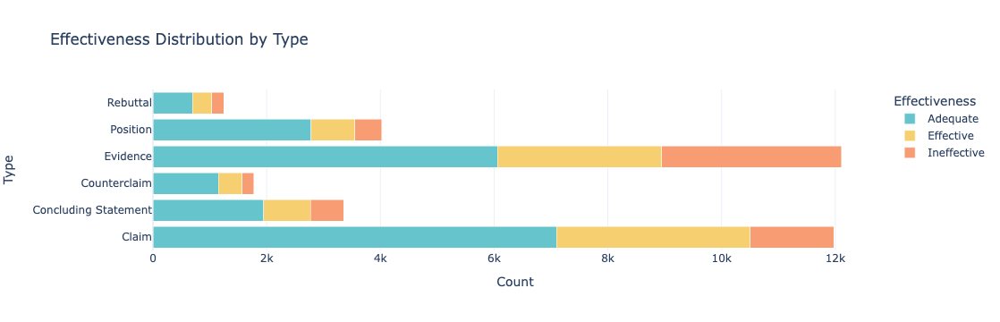

In [43]:
import plotly.express as px

# Grouping data by 'type' and 'effectiveness' and counting occurrences
data = combined_df.groupby(['type', 'effectiveness']).size().reset_index(name='count')

# Creating a stacked bar chart with Plotly Express
fig = px.bar(
    data,
    x='count',
    y='type',
    color='effectiveness',
    orientation='h',
    title='Effectiveness Distribution by Type',
    labels={'type': 'Type', 'count': 'Count', 'effectiveness': 'Effectiveness'},
    color_discrete_sequence=px.colors.qualitative.Pastel  # Aesthetic color palette
)

# Updating layout for better visuals
fig.update_layout(
    barmode='stack',
    xaxis=dict(title='Count'),
    yaxis=dict(title='Type'),
    legend=dict(title='Effectiveness'),
    template='plotly_white'  # Clean visual template
)

# Display the figure
fig.show()


👉 The graph illustrates the distribution of text effectiveness across different classification labels. It highlights that texts in the **Evidence** class are predominantly ineffective. The **Claim** class, on the other hand, exhibits the highest proportion of texts with adequate effectiveness. Additionally, effective texts are notably dense within the **Evidence** and **Claim** classes. Compared to these two, the remaining classes demonstrate a lower distribution of effectiveness.

**Displaying Labels**🎨

In [44]:
def print_colored_text(df, topic_id):
    # Filter for the specific topic_id
    df_essay = df[df['topic_id'] == topic_id].copy()
    
    # Calculate start and end positions for each text segment
    current_pos = 0
    ents = []
    essay_text = ""
    
    for _, row in df_essay.iterrows():
        text = row['text']
        start = current_pos
        end = start + len(text)
        
        # Append entity information (start, end, label)
        ents.append({
            "start": start,
            "end": end,
            "label": row['type']
        })
        
        # Concatenate all texts together (with space in between)
        essay_text += text + " "
        current_pos = end + 1  # Add 1 for the space between the texts
    
    # Create a document in spaCy format
    doc2 = {
        "text": essay_text.strip(),
        "ents": ents
    }

    # Define colors for each entity type
    colors = {
        'Position': '#f9d5de',  
        'Claim': '#adcfad',    
        'Evidence': '#fbbf9a',  
        'Counterclaim': '#bdf2fa',
        'Concluding Statement': '#eea69e',  
        'Rebuttal': '#d1f8f4',  
    }
    
    # Set options for spaCy displacy visualization
    options = {"ents": df_essay['type'].unique().tolist(), "colors": colors}
    
    # Render the essay text with colored entities using spaCy displacy
    displacy.render(doc2, style="ent", options=options, manual=True, jupyter=True)


In [45]:
print_colored_text(combined_df, "00BD97EA4041")

## 3.3 Word Cloud

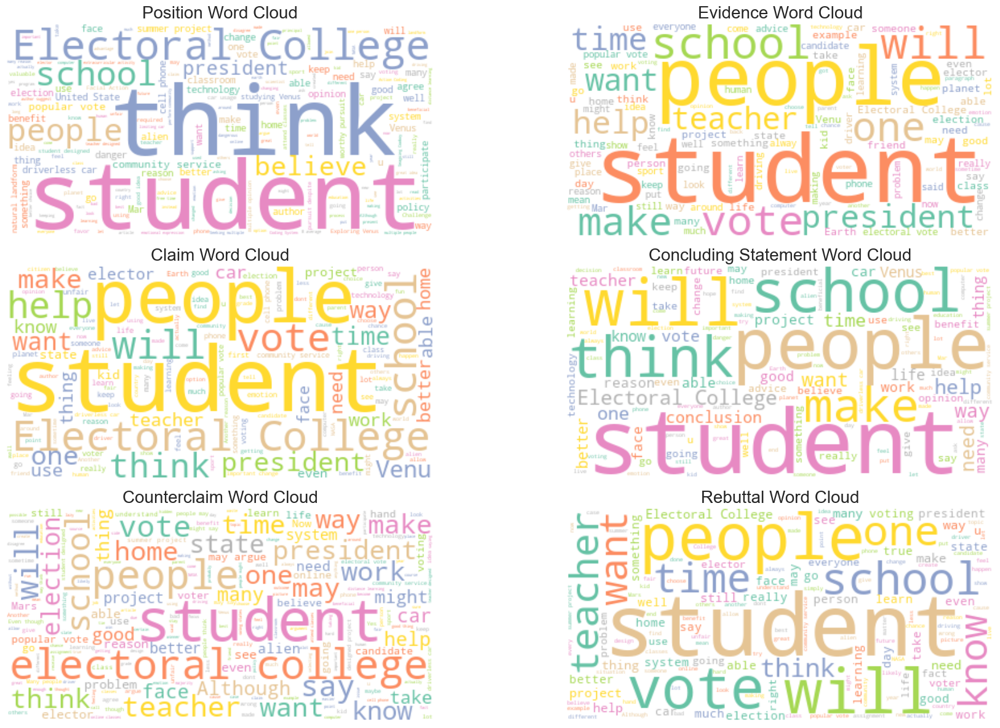

In [46]:
text_data = {
    'Position': combined_df[combined_df.type == 'Position'].text.values,
    'Evidence': combined_df[combined_df.type == 'Evidence'].text.values,
    'Claim': combined_df[combined_df.type == 'Claim'].text.values,
    'Concluding Statement': combined_df[combined_df.type == 'Concluding Statement'].text.values,
    'Counterclaim': combined_df[combined_df.type == 'Counterclaim'].text.values,
    'Rebuttal': combined_df[combined_df.type == 'Rebuttal'].text.values
}

# Set the stopwords
stopwords_set = set(STOPWORDS)

# Create a color palette (Blues, you can choose others like 'Reds', 'Purples', etc.)
color_palette = sns.color_palette("Set2", as_cmap=True)

# Function to generate a color for each word based on the colormap
def color_func(word, *args, **kwargs):
    # Using the frequency of the word to determine color (normalize using min-max)
    color = color_palette(np.random.rand())  # Random color from the palette
    return 'rgb({},{},{})'.format(int(color[0] * 255), int(color[1] * 255), int(color[2] * 255))

# Set up the figure for subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 12))

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through each text type, create the word clouds and display
for idx, (text_type, text) in enumerate(text_data.items()):
    # Create WordCloud instance
    wc = WordCloud(background_color="#fff", max_words=1000, stopwords=stopwords_set)
    wc.generate(" ".join(text))
    
    # Recolor the word cloud using the chosen color palette
    axes[idx].imshow(wc.recolor(color_func=color_func, random_state=42), interpolation="bilinear")
    axes[idx].set_title(f"{text_type} Word Cloud", fontsize=20)
    axes[idx].axis("off")

# Show the plot
plt.tight_layout()
plt.show()


**Does the text contain "I think"?**

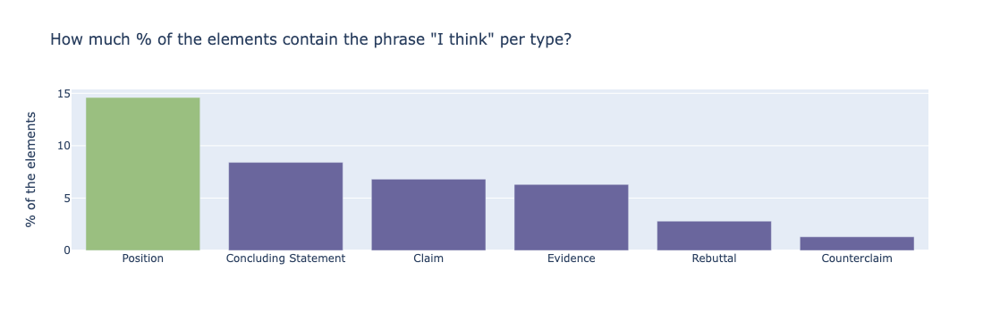

In [47]:
def contain_phrase(phrase):
# add a new column if_contain indicating if the phrase 
# I think exists in the column discourse_text
    combined_df['if_contain'] = np.where(combined_df['text'].str.find(phrase) != -1, True, False)

    # get the share of the elements that contain target phrase
    train_if_contain_aggr = combined_df.groupby(['type','if_contain']).nunique().reset_index()[['type','if_contain','topic_id']]
    train_if_contain_aggr['sum'] = train_if_contain_aggr['topic_id'].groupby(train_if_contain_aggr['type']).transform('sum')
    train_if_contain_aggr['share'] = round(train_if_contain_aggr['topic_id'] * 100 / train_if_contain_aggr['sum'],1)
    train_if_contain_aggr = train_if_contain_aggr.loc[train_if_contain_aggr['if_contain'] == True].sort_values(by = 'share', ascending = False)
    
    # plot a bar chart 
    colors = ['#6A669D'] * 7
    colors[0] = "#9ABF80"
    
    fig = go.Figure(data=[go.Bar(
        x=train_if_contain_aggr['type'],
        y=train_if_contain_aggr['share'],
        name = "",
        hovertemplate='<b>%{y:.1f}% of elements in %{x} does</b>',
        marker_color=colors # marker color can be a single color value or an iterable
    )])
    fig.update_layout(title_text='How much % of the elements contain the phrase "{}" per type?'.format(phrase),
                     yaxis_title="% of the elements")
    fig.show()
contain_phrase("I think")

👉 The result is expected. The "Position" type accounts for 14.6% of the text, followed by "Concluding Statement" at 8.4%.

## 3.5 Topic Identification

👉 In this section, we will identify the topic of each text. This approach helps us gain a general understanding of the content and pinpoint texts that are relevant to the subject matter. 

There are several methods used to identify topics. One of these methods is **BERTopic**. This technique utilizes transformer-based models to create embeddings of the text and then applies clustering algorithms to discover hidden topics. By using BERTopic, we can efficiently extract meaningful themes from a large corpus of text, providing valuable insights into the underlying structure of the data.

First, we will organize the texts by their topic_id. Then, we will merge the texts associated with each unique topic_id into a single entry.

In [8]:
grouped_data = combined_df.groupby(['topic_id'])['text'].apply(' '.join).reset_index()

In [9]:
sws = set(stopwords.words('english'))
docs = []
for _, row in tqdm(grouped_data.iterrows(), total=grouped_data.shape[0]):
    text = row['text']
    word_tokens = word_tokenize(text)  # Tokenizasyon
    cleaned_text = " ".join([w for w in word_tokens if not w.lower() in sws])  # Removing Stopword 
    docs.append(cleaned_text)

100%|█████████████████████████████████████| 4191/4191 [00:03<00:00, 1189.49it/s]


The line of code uses **BERTopic** (a topic modeling technique) to identify topics in the given text documents (`docs`), by analyzing unigrams, bigrams, and trigrams (i.e., n-grams with a range of 1 to 3) and selecting the top 5 most frequent words for each topic, while also providing the probability distribution of the topics for each document.

In [10]:
topic_model = BERTopic(n_gram_range=(1, 3), top_n_words=5, verbose=True)
topics_1, probs = topic_model.fit_transform(docs)

2024-12-02 13:52:31,898 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/131 [00:00<?, ?it/s]

2024-12-02 13:52:56,668 - BERTopic - Embedding - Completed ✓
2024-12-02 13:52:56,669 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 13:53:03,120 - BERTopic - Dimensionality - Completed ✓
2024-12-02 13:53:03,120 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 13:53:03,177 - BERTopic - Cluster - Completed ✓
2024-12-02 13:53:03,179 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 13:53:05,722 - BERTopic - Representation - Completed ✓


In [11]:
tm_meta = topic_model.get_topic_info()
tm_meta.to_csv("topic_model_metadata.csv", index=False)
tm_meta.groupby('Name')[['Count']].sum()

,Count
Name,
-1_sport_sports_genericname_students,21
0_electoral_vote_college_electoral college,927
10_average_sports_students_school,122
11_seagoing_animals_program_cowboys,80
12_driving_phone_texting_cell,77
13_activity_students_school_extracurricular,74
14_extracurricular_activities_activity_students,71
15_luke_seagoing_animals_program,59
1_emotions_computer_technology_facial,410


👉 This table displays the name of each topic within the text, with a total of 18 distinct topics identified.

In [12]:
pred_topics = pd.DataFrame()

pred_topics["topic_id"] = grouped_data['topic_id']
pred_topics["topic"] = topics_1

pred_topics['prob'] = probs
pred_topics.to_csv("topic_model_feedback.csv", index=False)
pred_topics

,topic_id,topic,prob
0,00066EA9880D,2,1.000000
1,000E6DE9E817,10,0.915899
2,0016926B079C,5,1.000000
3,00203C45FC55,5,1.000000
4,0029F4D19C3F,10,0.497184
...,...,...,...
4186,FFA381E58FC6,8,1.000000
4187,FFC43F453EF6,0,1.000000
4188,FFD97A99CEBA,1,1.000000
4189,FFF868E06176,7,1.000000


👉 This dataframe presents the topic names associated with each topic_id. Next, we will visualize the results.

In [13]:
tm_df = tm_meta.rename(columns={'Topic': 'topic', 'Name': 'topic_name'}).drop(columns=['Count'])
tm_df.topic_name = tm_df.topic_name.apply(lambda n: ' '.join(n.split('_')[1:]))

pred_topics= pred_topics.merge(tm_df, on='topic', how='left')
train_df=pd.DataFrame()
train_df = combined_df.merge(pred_topics, on='topic_id', how='left')
train_df=train_df.drop(['full_text','Representation','Representative_Docs','prob'],axis=1)
train_df['word_count'] = train_df.text.apply(lambda x: len(x.split()))
train_df.head(5)

,id,topic_id,text,type,effectiveness,topic,topic_name,word_count
0,9704a709b505,007ACE74B050,"On my perspective, I think that the face is a natural landform because I dont think that there is any life on Mars. In these next few paragraphs, I'll be talking about how I think that is is a natural landform",Position,Adequate,4,face mars aliens landform,41
1,de347c859ab6,00944C693682,"With so many things in this world that few people agree on, this is a nice change to see in regards the removal of so many cars. Why would they all agree, one might ask. Well, there are plenty of reasons. \n",Position,Effective,2,cars car driverless driverless cars,41
2,c20937683442,00BD97EA4041,"No because, why should a computer know how your feeling?",Position,Adequate,1,emotions computer technology facial,10
3,9d03e2bef0ff,00C6E82FE5BA,I think that it wouldn't be valueable to have technology be able to read emotions,Position,Adequate,1,emotions computer technology facial,15
4,c2203a58aa5c,013B9AA6B9DB,"Well, some people believe that it was something made by aliens. I am here to prove that it was not. \n",Position,Adequate,4,face mars aliens landform,20


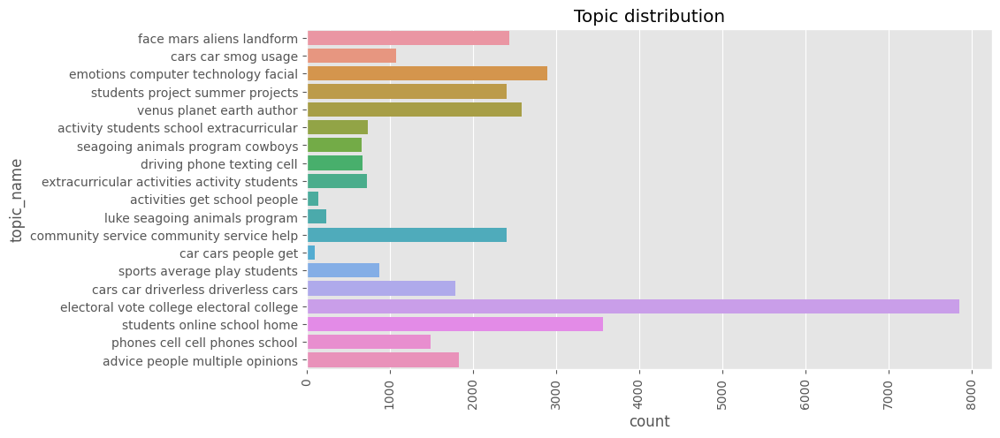

In [27]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
 
sns.countplot(y="topic_name", data=train_df, linewidth=1.25, alpha=1, ax=ax, zorder=2, orient='v')
ax.set_title("Topic distribution")

for tick in ax.get_xticklabels():
    tick.set_rotation(90)
fig.show()

👉 The content of the texts most frequently mentions the topic "electoral vote college electoral college." Following this, the topic "students online school home" comes next. Overall, there are topics related to cars, planets, phones, and students.

In [55]:
def show_type(type, topic):
    filt = train_df.query(f'type == "{type}"').query(f'topic == {topic}').sample(frac=1, random_state=420)
    display(HTML(
        f"""
        <h4><code>{type}</code> examples</h4>
        <table>
            <tr>
              <th width=33%>Ineffective</th>
              <th width=33%>Adequate</th>
              <th width=33%>Effective</th>
            </tr>
            <tr>
              <td>{filt.query("effectiveness == 'Ineffective'").iloc[0].text}</td>
              <td>{filt.query("effectiveness == 'Adequate'").iloc[0].text}</td>
              <td>{filt.query("effectiveness == 'Effective'").iloc[0].text}</td>
            </tr>
        </table>
        """
    ))
types = train_df.type.unique()
for dt in types: show_type(dt, 10)

Ineffective,Adequate,Effective
I am asking you why are you changing that the students should have a grade average of a B to play sports that's I am writing to tell you why it should be changed.,A better idea for you change is that the students should have a C in the first semester to participate in sports and other activities. Then in the second semester the students must have a B to participate.,"Having a C average is still passing and that's what we should contemplate on, not a B average. If we eliminate the sport activity from the child it wont benefit them"


Ineffective,Adequate,Effective
I think if your good and sports you can participate in sports,i don't think anyone would like that besides sports are the only fun thing to do at school so yea that's all i really got to say.,what's the point? everything is fine just the way it i. why change it?


Ineffective,Adequate,Effective
i don't like the way ur doing things put the school policy at if they go under a d there off the team all my friends have good grades they all play football and basketball and u think they would like it if they got kicked off the team because there grade went under a b,those with D and F average of course they shouldn't be aloud to participate. Now how you can find out if the students are doing their work is ask the teachers how they are behaving and acting in the classroom.,"Some students know that they are exceedingly well at playing their sport. But, on the other hand, they know that they do not achieve so much academically."


Ineffective,Adequate,Effective
if you do good in school that mite do the trick to.,More students need to pay more attention to school so they can be in sports.,Now I can understand why you would change the policy for people who don't care about they're grade's and don't care to keep them up.


Ineffective,Adequate,Effective
"Therefore if they really loved sports and wanted to play in them, then they would try to raise their grade for it.",but not every kid has a GPA of 4.0,"No, that is not entirely true. A way to fix this predicament is to have consequences and tutors."


Ineffective,Adequate,Effective
So i was wondering if you would considered not letting theses kids play sports because the don't have a bee average.,"All students have been talking about this. Some students are better at sports than school work. Maybe you will consider that changing the school policy will be a bad idea. You may think different But i hope you will change your mind. If students cant play any sports than who will represent us in the school? If students did not write you, you should take some time and ask them what they think. I hope you can clearly see the other side to this now.","You should really consider these possibilities for the students future and how it would impact them when they go to collage, get a job, and have a family. I think you should only have people who have D's or below to not be able to play sports, but let the people who have a C and up be able to play sports. Just remember these ideas and how it could impact the future of those students and how they will live the rest of there lives wonder how to play that sport and teach there kid to learn that sport, but they wouldn't be able to do that if you do not change the grades to have them play sports cause of a grade rule that you put up. So let those kids with a C average play sports."


👉 Now, we have identified the topic for each text and have assigned the respective topics to the texts.

# 4.Preprocessing 📋

👉 In this section, we will preprocess our text data by removing stopwords, punctuation, numbers, and unnecessary whitespace. Additionally, we will convert categorical variables into a format suitable for machine learning algorithms to enhance predictive performance.

## 4.1 Clean Text Data

In [73]:
# Define the clean_text function
def clean_text(text):
    # Lowercase the text
    text = text.lower()
    #Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)

    #Remove new lines
    text = text.replace('\n', ' ')

    #Remove numbers
    text = re.sub(r'\d+', '', text)
   
    # Normalize whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text



# Function to remove stopwords using SpaCy
def remove_stopwords_spacy(text):
    tokens = text.split()
    tokens = [word for word in tokens if word.lower() not in stop_words]
    return ' '.join(tokens)

# Apply cleaning function
train_df['final_cleaned_text'] = train_df['text'].apply(clean_text).apply(remove_stopwords_spacy)

## 4.2 Label Encoding 

👉 We will apply label encoding to the categorical variables to enhance efficiency in our workflow.

In [127]:
# Initialize LabelEncoder
label_encoder_type = LabelEncoder()
label_encoder_effectiveness= LabelEncoder()

# Apply Label Encoding on 'type' (target variable for classification)
train_df['type_encoded'] = label_encoder_type.fit_transform(train_df['type'])

# Apply Label Encoding on 'effectiveness' (if ordinal or you want to convert to numeric)
train_df['effectiveness_encoded'] = label_encoder_effectiveness.fit_transform(train_df['effectiveness'])


# 5. Feature Engineering 🚀

👉 In this section, we will concentrate on creating new features from the existing ones. Feature extraction plays a crucial role in uncovering hidden patterns in the data.

For feature engineering, we will improve the Term Frequency-Inverse Document Frequency (**TF-IDF**) technique to extract relevant features. TF-IDF is a numerical representation of text that measures the significance of a word in a document by considering its frequency within the document and its rarity across the entire corpus.

In [128]:
# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=3000)

# Fit and transform the text data into TF-IDF features
tfidf_matrix = tfidf_vectorizer.fit_transform(train_df['final_cleaned_text'])

# Convert the TF-IDF matrix to a DataFrame for better readability
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())


In [129]:
# Concatenate the original DataFrame with the TF-IDF DataFrame
final_df = pd.concat([train_df[['topic', 'word_count', 'effectiveness_encoded', 'type_encoded']], tfidf_df], axis=1)

# 6. Normalization 

👉 In this section, we will apply data normalization using the z-normalization technique. The purpose of normalization is to standardize the scale of numerical features in the dataset, ensuring they all align within a uniform range or scale.

In [130]:
# Apply Z-normalization (Z-score normalization) to all numerical columns except 'type_encoded'
scaler = StandardScaler()

# Select all columns except 'type_encoded' dynamically (including TF-IDF columns)
numerical_columns = final_df.columns.difference(['type_encoded'])

# Normalize the selected columns
final_df[numerical_columns] = scaler.fit_transform(final_df[numerical_columns])

# 7. Cross Validation 🪓

👉 We will utilize the train_test_split function to divide our dataset, allocating 80% for training and 20% for testing.

In [131]:
X=final_df.drop('type_encoded',axis=1)
y=final_df['type_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=42,stratify=y)

#  5. Classification Models 🛠

👉 In this segment, we will employ seven distinct classification models to assess their respective classification performances. The models encompass K-Nearest Neighbors, Support Vector Machine, Logistic Regression, Naive Bayes, Random Forest, Gradient Boosting, and Extreme Gradient Boosting techniques

## 5.1 Logistic Regression

In [132]:
LRclassifier = LogisticRegression(solver='saga', max_iter=500, random_state=1)
LRclassifier.fit(X_train, y_train)

y_pred = LRclassifier.predict(X_test)

In [136]:
# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
LRAcc = accuracy_score(y_test_decoded, y_pred_decoded)
print('LR accuracy: {:.2f}%'.format(LRAcc * 100))


                      precision    recall  f1-score   support

               Claim       0.65      0.70      0.67      2395
Concluding Statement       0.47      0.43      0.45       670
        Counterclaim       0.29      0.26      0.27       355
            Evidence       0.75      0.71      0.73      2421
            Position       0.54      0.55      0.55       805
            Rebuttal       0.13      0.12      0.13       249

            accuracy                           0.62      6895
           macro avg       0.47      0.46      0.47      6895
        weighted avg       0.61      0.62      0.62      6895

[[1668   70  107  267  193   90]
 [  97  286   17  183   70   17]
 [ 149    8   94   49   28   27]
 [ 354  158   63 1731   57   58]
 [ 212   60   31   42  442   18]
 [ 103   23   17   48   27   31]]
LR accuracy: 61.67%


## 5.2 K-Nearest Neighbour (KNN)

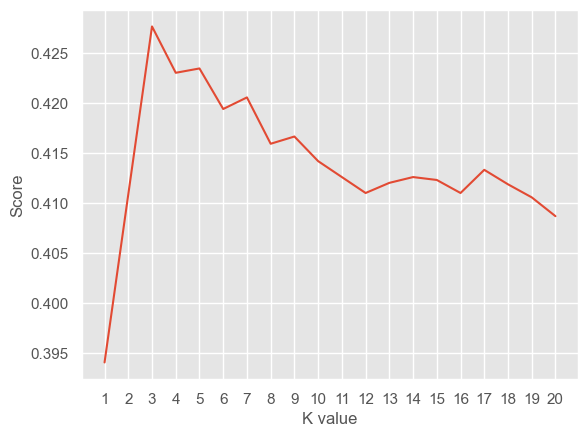

KNN best accuracy: 42.77%


In [113]:
scoreListknn = []
for i in range(1,21):
    KNclassifier = KNeighborsClassifier(n_neighbors = i)
    KNclassifier.fit(X_train, y_train)
    scoreListknn.append(KNclassifier.score(X_test, y_test))
    
plt.plot(range(1,21), scoreListknn)
plt.xticks(np.arange(1,21,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()
KNAcc = max(scoreListknn)
print("KNN best accuracy: {:.2f}%".format(KNAcc*100))

In [139]:
KNclassifier = KNeighborsClassifier(n_neighbors = 3)
KNclassifier.fit(X_train, y_train)
y_pred = KNclassifier.predict(X_test)

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
KNNAcc = accuracy_score(y_test_decoded, y_pred_decoded)
print('KNN accuracy: {:.2f}%'.format(KNNAcc * 100))

                      precision    recall  f1-score   support

               Claim       0.40      0.77      0.53      2395
Concluding Statement       0.21      0.08      0.11       670
        Counterclaim       0.20      0.07      0.11       355
            Evidence       0.65      0.26      0.37      2421
            Position       0.45      0.46      0.46       805
            Rebuttal       0.06      0.02      0.03       249

            accuracy                           0.43      6895
           macro avg       0.33      0.28      0.27      6895
        weighted avg       0.45      0.43      0.39      6895

[[1855   67   50  202  206   15]
 [ 452   51    9   53   96    9]
 [ 247    9   26   29   42    2]
 [1541   72   25  637   81   65]
 [ 352   31   16   31  374    1]
 [ 176    8    3   28   28    6]]
KNN accuracy: 42.77%


## 5.3 Support Vector Machine

In [140]:
SVCclassifier = SVC(kernel='rbf', max_iter=500)
SVCclassifier.fit(X_train, y_train)

y_pred = SVCclassifier.predict(X_test)

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
SVCAcc = accuracy_score(y_test_decoded, y_pred_decoded)

print('SVC accuracy: {:.2f}%'.format(SVCAcc*100))

                      precision    recall  f1-score   support

               Claim       0.47      0.65      0.54      2395
Concluding Statement       0.37      0.23      0.28       670
        Counterclaim       0.29      0.26      0.28       355
            Evidence       0.67      0.39      0.50      2421
            Position       0.38      0.61      0.47       805
            Rebuttal       0.13      0.06      0.09       249

            accuracy                           0.47      6895
           macro avg       0.39      0.37      0.36      6895
        weighted avg       0.50      0.47      0.46      6895

[[1549   19   85  265  445   32]
 [ 227  154   17  115  148    9]
 [ 150    5   94   31   59   16]
 [1025  210   89  955   99   43]
 [ 245   13   17   31  493    6]
 [ 125   13   22   34   39   16]]
SVC accuracy: 47.30%


## 5.4 Naive Bayes

In [141]:
NBclassifier2 = GaussianNB()
NBclassifier2.fit(X_train, y_train)

y_pred = NBclassifier2.predict(X_test)

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
NBAcc2 = accuracy_score(y_test_decoded, y_pred_decoded)

print('Gaussian Naive Bayes accuracy: {:.2f}%'.format(NBAcc2*100))

                      precision    recall  f1-score   support

               Claim       0.22      0.06      0.10      2395
Concluding Statement       0.20      0.25      0.22       670
        Counterclaim       0.10      0.30      0.15       355
            Evidence       0.80      0.24      0.37      2421
            Position       0.31      0.61      0.41       805
            Rebuttal       0.05      0.43      0.10       249

            accuracy                           0.23      6895
           macro avg       0.28      0.32      0.23      6895
        weighted avg       0.42      0.23      0.25      6895

[[154 164 497  74 533 973]
 [ 55 170  74  39 189 143]
 [ 15  20 106  13  55 146]
 [431 455 298 588 245 404]
 [ 20  31  68   5 489 192]
 [ 13  19  51  14  45 107]]
Gaussian Naive Bayes accuracy: 23.41%


## 5.5 Decision Tree

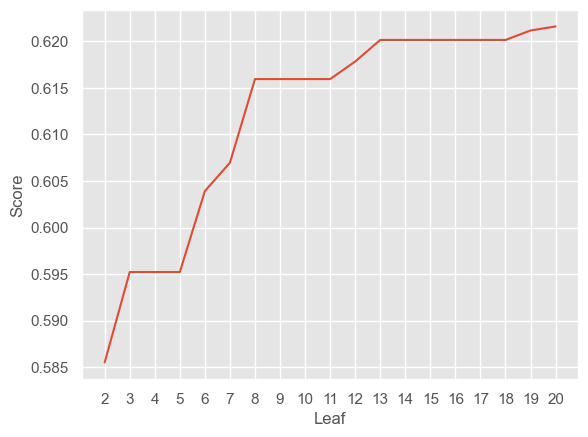

Decision Tree Accuracy: 62.16%


In [143]:
scoreListDT = []
for i in range(2,21):
    DTclassifier = DecisionTreeClassifier(max_leaf_nodes=i)
    DTclassifier.fit(X_train, y_train)
    scoreListDT.append(DTclassifier.score(X_test, y_test))
    
plt.plot(range(2,21), scoreListDT)
plt.xticks(np.arange(2,21,1))
plt.xlabel("Leaf")
plt.ylabel("Score")
plt.show()
DTAcc = max(scoreListDT)
print("Decision Tree Accuracy: {:.2f}%".format(DTAcc*100))

In [150]:
DTclassifier = DecisionTreeClassifier(max_leaf_nodes=20)
DTclassifier.fit(X_train, y_train)
y_pred = DTclassifier.predict(X_test)

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
DTAcc = accuracy_score(y_test_decoded, y_pred_decoded)

print('Decision Tree accuracy: {:.2f}%'.format(DTAcc*100))

                      precision    recall  f1-score   support

               Claim       0.56      0.87      0.68      2395
Concluding Statement       0.95      0.13      0.23       670
        Counterclaim       0.43      0.07      0.12       355
            Evidence       0.71      0.79      0.74      2421
            Position       0.53      0.22      0.31       805
            Rebuttal       0.00      0.00      0.00       249

            accuracy                           0.62      6895
           macro avg       0.53      0.35      0.35      6895
        weighted avg       0.62      0.62      0.56      6895

[[2091    0   16  202   86    0]
 [ 167   87    3  389   24    0]
 [ 246    0   26   58   25    0]
 [ 498    4    3 1902   14    0]
 [ 541    0    9   75  180    0]
 [ 168    1    4   67    9    0]]
Decision Tree accuracy: 62.16%


## 5.6 Random Forest

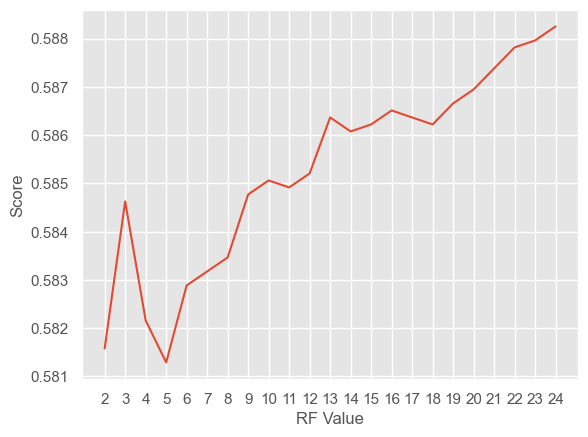

Random Forest Accuracy:  58.83%


In [147]:
scoreListRF = []
for i in range(2,25):
    RFclassifier = RandomForestClassifier(n_estimators = 1000, random_state = 1, max_leaf_nodes=i)
    RFclassifier.fit(X_train, y_train)
    scoreListRF.append(RFclassifier.score(X_test, y_test))
    
plt.plot(range(2,25), scoreListRF)
plt.xticks(np.arange(2,25,1))
plt.xlabel("RF Value")
plt.ylabel("Score")
plt.show()
RFAcc = max(scoreListRF)
print("Random Forest Accuracy:  {:.2f}%".format(RFAcc*100))

In [149]:
RFclassifier = RandomForestClassifier(n_estimators = 1000, random_state = 1, max_leaf_nodes=24)
RFclassifier.fit(X_train, y_train)
y_pred = RFclassifier.predict(X_test)

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
RFAcc = accuracy_score(y_test_decoded, y_pred_decoded)

print('Random Forest accuracy: {:.2f}%'.format(RFAcc*100))

                      precision    recall  f1-score   support

               Claim       0.54      0.87      0.66      2395
Concluding Statement       1.00      0.01      0.03       670
        Counterclaim       0.00      0.00      0.00       355
            Evidence       0.65      0.81      0.72      2421
            Position       0.00      0.00      0.00       805
            Rebuttal       0.00      0.00      0.00       249

            accuracy                           0.59      6895
           macro avg       0.37      0.28      0.24      6895
        weighted avg       0.51      0.59      0.49      6895

[[2083    0    0  312    0    0]
 [ 199    9    0  462    0    0]
 [ 260    0    0   95    0    0]
 [ 457    0    0 1964    0    0]
 [ 720    0    0   85    0    0]
 [ 167    0    0   82    0    0]]
Random Forest accuracy: 58.83%


## 5.7 XGBoost

In [151]:
GBclassifier = GradientBoostingClassifier()
GBclassifier.fit(X_train, y_train)

y_pred = GBclassifier.predict(X_test)
# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))

# Print the confusion matrix with class names
print(confusion_matrix(y_test_decoded, y_pred_decoded))

# Calculate the accuracy score
GBAcc = accuracy_score(y_pred,y_test)

print('Gradient Boosting accuracy: {:.2f}%'.format(GBAcc*100))

                      precision    recall  f1-score   support

               Claim       0.61      0.87      0.72      2395
Concluding Statement       0.81      0.26      0.39       670
        Counterclaim       0.69      0.21      0.32       355
            Evidence       0.73      0.80      0.77      2421
            Position       0.73      0.39      0.51       805
            Rebuttal       0.35      0.06      0.11       249

            accuracy                           0.67      6895
           macro avg       0.65      0.43      0.47      6895
        weighted avg       0.68      0.67      0.64      6895

[[2090    6   14  212   62   11]
 [ 133  173    1  327   32    4]
 [ 209    0   75   54   11    6]
 [ 435   26    6 1947    3    4]
 [ 418    6    9   57  310    5]
 [ 159    2    4   64    4   16]]
Gradient Boosting accuracy: 66.87%


## 5.8 Sentence Based Classification (BERT)

👉 **BERT** (Bidirectional Encoder Representations from Transformers) is a pre-trained language model that uses bidirectional context to understand the meaning of words in a sentence, improving performance in various natural language processing tasks. 

In this section, we will apply the BERT model to text data. BERT, a state-of-the-art algorithm developed for natural language processing tasks, will be used to generate results and compare its performance with classical machine learning algorithms.

First, we define the model as "bert-base-uncased" and proceed with training it. Since our model deals with 6 distinct classes, the label count is set to 6.

In [253]:
model_name = "bert-base-uncased"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertForSequenceClassification.from_pretrained(model_name, num_labels=6)

Before modeling, we split the data into features and labels. However, since we only want to use the text values and labels, we assign the text features to `X_bert` and the labels to `y`.

In [255]:
X_bert = list(train_df["text"])
X_train, X_val, y_train, y_val = train_test_split(X_bert,y, test_size=0.2)

Tokenization plays a crucial role in the algorithm. The code uses the tokenizer to process the training and validation text data, ensuring that the sequences are padded and truncated to a maximum length of 512 tokens for consistent input to the model.

In [256]:
X_train_tokenized = tokenizer(X_train, padding=True, truncation=True, max_length=512)
X_val_tokenized = tokenizer(X_val, padding=True, truncation=True, max_length=512)

the Dataset class is to create a custom dataset class for tokenized text data and labels, enabling efficient data loading for training and validation in a PyTorch model.

In [257]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels=None):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        if self.labels:
            item["labels"] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.encodings["input_ids"])

train_dataset = Dataset(X_train_tokenized, y_train)
val_dataset = Dataset(X_val_tokenized, y_val)

We compute the metrics after the classification

In [202]:
def compute_metrics(p):
    pred, labels = p
    pred = np.argmax(pred, axis=1)

   
    accuracy = accuracy_score(y_true=labels, y_pred=pred)
    recall = recall_score(y_true=labels, y_pred=pred, average='macro')
    precision = precision_score(y_true=labels, y_pred=pred, average='macro')
    f1 = f1_score(y_true=labels, y_pred=pred, average='macro')
    
    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

Now, we will set up and train a pre-trained model using the Hugging Face `Trainer` class, with specified training parameters, evaluation strategy, and early stopping callback for optimization.

In [179]:
# Define Trainer
args = TrainingArguments(
    output_dir="output",
    evaluation_strategy="steps",
    eval_steps=500,
    per_device_train_batch_size=5,
    per_device_eval_batch_size=5,
    num_train_epochs=3,
    seed=42,
    load_best_model_at_end=True,
)
trainer = Trainer(
    model=model,
    args=args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)],
)

# Train pre-trained model
trainer.train()


Step,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
500,1.185300,1.011465,0.654097,0.627098,0.376285,0.365208
1000,0.991500,0.940725,0.688180,0.670566,0.507548,0.514262
1500,0.905500,0.867045,0.703698,0.623035,0.579548,0.593856
2000,0.895200,0.859903,0.708920,0.643283,0.591326,0.599926
2500,0.846100,0.861807,0.706599,0.661879,0.586177,0.602157
3000,0.871500,0.858724,0.725018,0.710568,0.579854,0.623916
3500,0.833900,0.802434,0.738506,0.737329,0.588773,0.632161
4000,0.808100,0.846800,0.735460,0.716156,0.606687,0.644238
4500,0.805700,0.963307,0.704278,0.736634,0.542034,0.595604
5000,0.783100,0.823446,0.722698,0.705556,0.614225,0.639882


TrainOutput(global_step=5000, training_loss=0.8925830383300781, metrics={'train_runtime': 2513.6958, 'train_samples_per_second': 32.914, 'train_steps_per_second': 6.583, 'total_flos': 1644503155200000.0, 'train_loss': 0.8925830383300781, 'epoch': 0.9064539521392313})

This table shows the training and validation loss, accuracy, precision, recall, and F1 scores at different training steps, indicating the model's performance during training, with the final output showing overall training metrics after 5000 steps.

In [252]:
val_dataset = HF_Dataset.from_dict({
    'input_ids': X_val_tokenized['input_ids'],
    'attention_mask': X_val_tokenized['attention_mask'],
    'labels': y_val
})


In [230]:
y_pred = predictions.predictions.argmax(axis=1)  
y_true = val_dataset['labels']

# Decode the predictions and the actual labels to the original class names
y_pred_decoded = label_encoder_type.inverse_transform(y_pred)
y_test_decoded = label_encoder_type.inverse_transform(y_test)

# Print the classification report with class names
print(classification_report(y_test_decoded, y_pred_decoded))
# Calculate the accuracy score
BertAcc = accuracy_score(y_pred,y_test)

print('BERT Accuracy: {:.2f}%'.format(BertAcc*100))

                      precision    recall  f1-score   support

               Claim       0.36      0.49      0.41      2395
Concluding Statement       0.11      0.07      0.09       670
        Counterclaim       0.08      0.03      0.04       355
            Evidence       0.35      0.33      0.34      2421
            Position       0.13      0.08      0.10       805
            Rebuttal       0.04      0.04      0.04       249

            accuracy                           0.31      6895
           macro avg       0.18      0.17      0.17      6895
        weighted avg       0.28      0.31      0.29      6895

BERT Accuracy: 30.50%


# 6. Model Comparison 👀

👉 We will compare classification accuracies between models.

In [232]:
compare = pd.DataFrame({'Model': ['Logistic Regression', 'K Neighbors', 
                                  'SVM', 
                                  'Gaussian NB', 'Decision Tree', 
                                  'Random Forest', 'Gradient Boost','BERT'], 
                        'Accuracy': [LRAcc*100, KNAcc*100, SVCAcc*100, 
                                     NBAcc2*100, DTAcc*100, 
                                     RFAcc*100, GBAcc*100,BertAcc*100]})
compare.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
6,Gradient Boost,66.874547
4,Decision Tree,62.160986
0,Logistic Regression,61.667875
5,Random Forest,58.825236
2,SVM,47.295141
1,K Neighbors,42.770123
7,BERT,30.500363
3,Gaussian NB,23.408267


## 6.1 Hyperparameter Tuning For XGBoost using Optuna 🌳

In [155]:
#columns have unique names by renaming duplicates
X.columns = [f"{col}_{i}" if X.columns.tolist().count(col) > 1 else col 
                    for i, col in enumerate(X.columns)]

In [234]:
import optuna
import xgboost as xgb
from sklearn.model_selection import cross_val_score

# Objective function for Optuna
def objective(trial):
    model_params = {
        "objective": "multi:softmax",  # Multi-class classification
        "eval_metric": "merror",  # Multi-class error rate
        "num_class": len(set(y)),  # Number of classes (depending on the dataset)
        "verbosity": 0,  # Suppress XGBoost's output
        "booster": "gbtree",  # Use gradient boosted trees
        "lambda": trial.suggest_float("lambda", 1e-8, 10.0, log=True),  # L2 regularization
        "alpha": trial.suggest_float("alpha", 1e-8, 10.0, log=True),  # L1 regularization
        "max_depth": trial.suggest_int("max_depth", 3, 12),  # Max depth of a tree
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),  # Learning rate
        "n_estimators": trial.suggest_int("n_estimators", 50, 300),  # Number of trees
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),  # Fraction of samples for each tree
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),  # Fraction of features for each tree
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),  # Minimum sum of instance weight (hessian) in a child
    }
    print(f"Trial parameters: {model_params}")
    # Initialize XGBoost model with trial parameters
    model = xgb.XGBClassifier(**model_params)
    
    # Use cross-validation to evaluate model performance
    score = cross_val_score(model, X, y, cv=3, scoring='accuracy')
    print(f"Trial score (accuracy): {score}") 
    return score

# Create Optuna study and optimize the objective function
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

# Print the best hyperparameters found by Optuna
print("Best hyperparameters: ", study.best_params)


Trial parameters: {'objective': 'multi:softmax', 'eval_metric': 'merror', 'num_class': 6, 'verbosity': 0, 'booster': 'gbtree', 'lambda': 7.4429634088362135, 'alpha': 6.493588438976773e-05, 'max_depth': 6, 'learning_rate': 0.05547687318135072, 'n_estimators': 69, 'subsample': 0.8693217142345302, 'colsample_bytree': 0.6674701627162167, 'min_child_weight': 3}
Trial score (accuracy): [0.64323007 0.63327822 0.6427639 ]
Trial parameters: {'objective': 'multi:softmax', 'eval_metric': 'merror', 'num_class': 6, 'verbosity': 0, 'booster': 'gbtree', 'lambda': 3.387390433193747e-06, 'alpha': 0.0017239763229549298, 'max_depth': 10, 'learning_rate': 0.2015896515103294, 'n_estimators': 293, 'subsample': 0.7329405945040555, 'colsample_bytree': 0.9463584692705393, 'min_child_weight': 2}
Trial score (accuracy): [0.68612948 0.66791402 0.67409277]
Trial parameters: {'objective': 'multi:softmax', 'eval_metric': 'merror', 'num_class': 6, 'verbosity': 0, 'booster': 'gbtree', 'lambda': 0.0006304340747048255, 

ValueError: No trials are completed yet.

In [242]:
best_params={
    'objective': 'multi:softmax',
    'eval_metric': 'merror',
    'num_class': 6,
    'verbosity': 0,
    'booster': 'gbtree',
    'lambda': 3.387390433193747e-06,
    'alpha': 0.0017239763229549298,
    'max_depth': 10,
    'learning_rate': 0.2015896515103294,
    'n_estimators': 293,
    'subsample': 0.7329405945040555,
    'colsample_bytree': 0.9463584692705393,
    'min_child_weight': 2
}


In [244]:
model = xgb.XGBClassifier(**best_params)

In [250]:
score = cross_val_score(model, X, y, cv=3, scoring='accuracy').mean()

In [251]:
score

0.6760454230997773

# 8. Generate Conclusion using BART 

👉 In this section, we will generate the conclusion using the BART model. BART, developed by Facebook,  is a transformer-based model designed for text summarization and a pre-trained large language model.

## 8.1 Creating Prompt 🎺

👉 The key step is crafting an effective prompt to achieve the best results from the model. Before creating the prompt, it's essential to group the data by topic ID.

In [14]:
combined_opinions = combined_df[combined_df['topic_id'].isin(conclusion['topic_id'].unique()[:20])].groupby('topic_id').apply(
    lambda x: {
        'Position': x[x['type'] == 'Position']['text'].tolist(),
        'Claim': x[x['type'] == 'Claim']['text'].tolist(),
        'Counterclaim': x[x['type'] == 'Counterclaim']['text'].tolist(),
        'Evidence': x[x['type'] == 'Evidence']['text'].tolist(),
        'Rebuttal': x[x['type'] == 'Rebuttal']['text'].tolist()
    }
).reset_index(name='grouped_texts')

👉 The model we will use is 'bart-large-cnn'; first, we define this model and use the BART model to generate a conclusion by extracting Position, claim, counterclaims, evidence, and rebuttals texts from the data.

In [15]:
# Initialize the BART model for summarization
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Define a new function for generating conclusions based on the arguments provided
def create_summary_from_debate(topic_id, grouped_texts):
    """
    Generate a concise conclusion based on the arguments of a debate including claims, counterclaims, evidence, and rebuttals.
    """
    paragraph = f"Topic ID: {topic_id}\n"
    paragraph += f"Position: {' '.join(grouped_texts.get('Position', []))}\n"
    paragraph += f"Claims: {' '.join(grouped_texts.get('Claim', []))}\n"
    paragraph += f"Counterclaims: {' '.join(grouped_texts.get('Counterclaim', []))}\n"
    paragraph += f"Evidence: {' '.join(grouped_texts.get('Evidence', []))}\n"
    paragraph += f"Rebuttals: {' '.join(grouped_texts.get('Rebuttal', []))}\n"
    paragraph += "Generate a conclusion based on the above arguments:"

    # Generate the summary using the BART model
    result = summarizer(paragraph, max_length=200, min_length=30, do_sample=False)
    print(topic_id,'summarized')
    # Return the generated summary text
    return result[0]['summary_text']

# Apply the new function to the grouped_opinions DataFrame
combined_opinions['generated_conclusion'] = combined_opinions.apply(
    lambda row: create_summary_from_debate(row['topic_id'], row['grouped_texts']), axis=1)



Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


007ACE74B050 summarized
00944C693682 summarized
00BD97EA4041 summarized
00C6E82FE5BA summarized
013B9AA6B9DB summarized
0158970BC5D2 summarized
015BB7DA58EE summarized
0167BBA84E43 summarized
0168325D0E24 summarized
01AFC67DF935 summarized
01B52B1D14F8 summarized
01E9D9CD5CBF summarized
01F69867D1BE summarized
021663FD2F2E summarized
022EE73C4244 summarized
023CEE52C08C summarized
02A3E737A10F summarized
030F2D5F039D summarized
037059DAD8EF summarized
0411A43FF828 summarized


In [48]:
combined_opinions[combined_opinions['topic_id']=='037059DAD8EF']['generated_conclusion']

18    The FACS was desinged to to recognize six everyday emotions. This would be helpful when a student is confused or does not understand what the teacher is trying to teach. The system could then modify the classwork that the student is working on.
Name: generated_conclusion, dtype: object

In [47]:
conclusion[conclusion['topic_id']=='037059DAD8EF']['text']

19    In conclusion the Facial Action Coding System should be used in classrooms for students. They will help improve their interest in topics at school, help the students understand better, it will help students be more possitive, and finally is will have a big impact on all of us. The Facial Action Coding System would be a new way of gaining more knowledge. It will help students and teachers understand eachother better. Overall this would be a positive impact amoung us all. 
Name: text, dtype: object

# 8.1 Performance Metrics 📉

👉 Now, we will compare our generated results with the original conclusion results using the ROUGE and BERTSCORE metrics.

In [16]:
conclusion_id=conclusion['topic_id'].unique()[:20]
combined_opinions['reference_conclusion'] = combined_opinions['topic_id'].apply(
    lambda topic_id: conclusion.loc[conclusion['topic_id'] == topic_id, 'text'].iloc[0]
    if topic_id in conclusion_id else None
)

In [17]:
# Load metrics
rouge = load_metric("rouge")
bertscore = load_metric("bertscore")

def evaluate_model_output(reference, prediction):
    # Ensure that neither reference nor prediction is None
    if reference is None or prediction is None:
        return {
            "ROUGE-1": None,
            "ROUGE-2": None,
            "ROUGE-L": None,
            "BERTScore (Precision)": None,
            "BERTScore (Recall)": None,
            "BERTScore (F1)": None
        }
    
    # Compute ROUGE
    rouge_scores = rouge.compute(predictions=[prediction], references=[reference])
    
    # Compute BERTScore
    bertscore_result = bertscore.compute(predictions=[prediction], references=[reference], lang="en")
    
    return {
        "ROUGE-1": rouge_scores['rouge1'].mid.fmeasure,
        "ROUGE-2": rouge_scores['rouge2'].mid.fmeasure,
        "ROUGE-L": rouge_scores['rougeL'].mid.fmeasure,
        "BERTScore (Precision)": bertscore_result["precision"][0],
        "BERTScore (Recall)": bertscore_result["recall"][0],
        "BERTScore (F1)": bertscore_result["f1"][0]
    }

# Example: Evaluate outputs for combined_opinions
results = []
for idx, row in combined_opinions.iterrows():
    reference = row['reference_conclusion']  # Reference text
    prediction = row['generated_conclusion']  # Model output
    
    # Only evaluate if both reference and prediction are non-empty
    if reference and prediction:
        evaluation = evaluate_model_output(reference, prediction)
        evaluation['topic_id'] = row['topic_id']
        results.append(evaluation)
    else:
        print(f"Skipping topic_id {row['topic_id']} due to missing reference or prediction")

# Convert results to DataFrame
evaluation_df = pd.DataFrame(results)



Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [49]:
evaluation_df.head(20)

,ROUGE-1,ROUGE-2,ROUGE-L,BERTScore (Precision),BERTScore (Recall),BERTScore (F1),topic_id
0,0.473118,0.109890,0.236559,0.878876,0.893463,0.886109,007ACE74B050
1,0.207792,0.000000,0.103896,0.856767,0.820930,0.838465,00944C693682
2,0.324324,0.055556,0.162162,0.865420,0.848394,0.856822,00BD97EA4041
3,0.142857,0.000000,0.119048,0.819431,0.829886,0.824626,00C6E82FE5BA
4,0.409091,0.162791,0.181818,0.894352,0.891674,0.893011,013B9AA6B9DB
5,0.192308,0.019608,0.115385,0.852525,0.860215,0.856353,0158970BC5D2
6,0.256410,0.026316,0.153846,0.853274,0.849589,0.851428,015BB7DA58EE
7,0.320000,0.109589,0.186667,0.862750,0.847920,0.855271,0167BBA84E43
8,0.258824,0.072289,0.211765,0.852015,0.836293,0.844081,0168325D0E24
9,0.153846,0.000000,0.153846,0.813450,0.831032,0.822147,01AFC67DF935


The table indicates that : 

- **ROUGE scores** (ROUGE-1, ROUGE-2, ROUGE-L) are relatively low, suggesting limited overlap between generated and reference summaries at both word and phrase levels, indicating room for improvement in capturing exact matches.
  
- **BERTScore values** (Precision, Recall, F1) are consistently high (above 0.8), reflecting strong semantic similarity between generated and reference summaries, which is a positive sign for meaningful content retention.  

Overall, the semantic quality is good, but exact textual matches could be improved.

# 9. Conclusion 📝

In this notebook, we conducted social media analysis using various NLP techniques and generated conclusions. We uncovered valuable insights through the following steps:

- We explored the data using various visualization techniques.

- We applied preprocessing methods such as label encoding and data cleaning.

- We extracted meaningful features using the TF-IDF approach.

- We applied z-normalization to scale the data values.

- We split the dataset into 80% training and 20% testing.

- We utilized several algorithms including Logistic Regression, K-Nearest Neighbors (KNN), Decision Trees, Support Vector Machines (SVM), Random Forest, XGBoost, as well as a sentence-based model (BERT).

- We compared the performance of all machine learning models, with XGBoost achieving the best result at 1.09% classification accuracy.
- We fine-tuned XGBoost's hyperparameters, resulting in a 4% improvement in performance.

- We used BART to generate conclusions and evaluate performance using ROUGE-1, ROUGE-2, ROUGE-L, and BERTScore (F1, Recall, Precision).

- Based on BART's results, we concluded that further fine-tuning of the generated text is needed.



 # 10. Future Planning 🏅

We have several plans to enhance the project moving forward:

1) **Handling Imbalanced Data**: Our current dataset is imbalanced, which could affect model performance. In the literature, there are three popular techniques to address this: oversampling, undersampling, and SMOTE. SMOTE, in particular, is widely used but also controversial. We plan to apply SMOTE and compare the results with other techniques to assess their impact on model accuracy.

2) **Memory Constraints with DeBERTa and Distilbert**: We attempted to use the DeBERTa and Distilbert models for the training process. However, due to memory limitations, we were unable to proceed with them effectively. Upgrading to a higher GPU capacity could potentially solve these issues, allowing us to explore these models further.

3) **Feature Extraction Improvement**: Currently, we are using the TF-IDF method for feature extraction. However, we can explore other techniques, such as Bag of Words (BoW), to compare which method works best for our dataset and task.

4) **Switching to NER (Named Entity Recognition)**: Instead of using label encoding for categorical data, we could try using Named Entity Recognition (NER) to better capture and categorize important entities in the text. This approach could potentially improve the classification results by recognizing specific named entities.

5) **Impact of Random Seeds on Model Performance**: The random initialization of model parameters can lead to variations in performance. We could run the model with different random seeds to determine if performance improvements or stability are possible with specific initializations.
